**Students' name**

Seif Labib - seif.labib@epfl.ch


This aim of this course is to review the evolution of image processing tools, from basics to deep learning algorithms. The semester is split into four labs :

* **Lab 1** : Introduction to Image Processing
* **Lab 2** : Object detection
* **Lab 3** : Object tracking
* **Lab 4** : Introduction to Deep Learning 


Let's start with the first chapter of this course!

# Chapter 1 : Introduction to Image Processing

(100 points)


In [2]:
import cv2 as cv
import numpy as np
import os
import math
from utils import *
import matplotlib.pyplot as plt
%matplotlib inline

## 1.1 Introduction to Basic Image Processing Using OpenCV and NumPy

(20 points)

In this section we start with the basic image processing in Python.

**Goals:**

1. Read an image, access and modify pixel values
2. Change color space
3. Understand the concepts of histogram and histogram equalization


### 1.1.1 Read an image, access and modify pixel values

The code in the next section shows how you can load an image into the Jupyter notebook. 

In [3]:
# reading an image
img = cv.imread(os.path.join('.', 'data', 'matterhorn.jpg'))
print('Image has dimensions: {}'.format(img.shape))
print('There is a total of {} elements'.format(img.size))

Image has dimensions: (339, 509, 3)
There is a total of 517653 elements


OpenCV loads the image in a type of variable called a NumPy array. Elements of a NumPy array are accessed through indexing with the operator `[.]` where `.` indicates which dimensions you're accessing. The dimensions are organized as follows: `rows, cols, channels`. More information about indexing in NumPy is in the [doc](https://docs.scipy.org/doc/numpy/reference/arrays.indexing.html).

**QUESTION:** (/2)
- What do `rows, cols, channels` represent in the image? 
- What is the value of channels for grayscale and colored image? 
- Is the `matterhorn.jpg` image a grayscale or color image? Why? 
- What is the meaning of each channel when the image is loaded with OpenCV ([Hint](https://docs.opencv.org/4.x/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56))



**YOUR ANSWER** 

- The rows represent the y axis of the images, while cols represents the columns, so the x axis of the images. The intersection of both columns and rows is the pixels. The channels represent the BGR channels, representing the blue, green and red channels of the pixels, each having a value for the specific colour, all combined to produce the actual color of the pixel seen on the image.

- A Greyscale image has all channels with the same intensity/value for each pixel (eg. (100, 100, 100)), and what varies in the image is the intensity of grey rather than the actual colour. The coloured image would have channels with different values for each given pixel, as the channels represent the actual color, so for a blue pixel, the channels would have the values (200, 0, 0) or a variation of this, since we want the pixel to be "dominated" by the blue colours, but still we would want to represent different shades of blue... (Same applies for both other channels.)

- The `matterhorn.jpg` image is a coloured image, since for a given pixel, its BGR values are different. Or we can just display the image (next kernel) and check for ourselves.

- OpenCV follows the BGR protocol (Blue, Green, Red), so the channels represent the intensity of each colour for the given pixel. The intensity can be seen as a "comparison" between colours to produce the pixel colour, meaning how much blue, green and red to mix to produce the wanted colour, if I mess up a certain colour value, I would have to "mess up" the other colours by the same percentage to balance things out and produce the same wanted colour for the pixel, since the mixing is comparative.


In the next cell we display the image using the provided function `display_image()` in file `utils.py`.

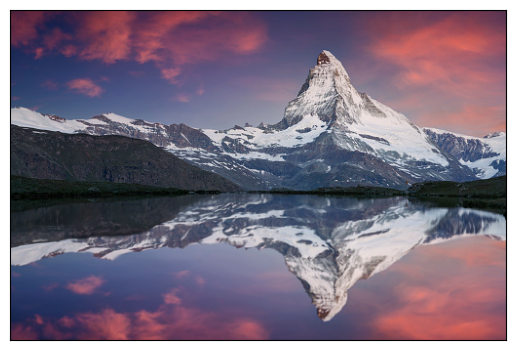

In [4]:
# Image can be displayed like this
display_image(img)
plt.show()

Now that you have an image loaded in the notebook, let's extract some properties from it. Here is how you can access a pixel or a region of the image, and modify a pixel value. 

In [5]:
pixel_row = 10 
pixel_col = 10

# accessing pixel (pixel_x, pixel_y) 
print('Pixel value at location {}x{} is {}'.format(pixel_row, pixel_col, img[pixel_row, pixel_col]))

# accessing region of the image starting at(pixel_row, pixel_col)
region_size = 10 
img_region = img[pixel_row:pixel_row+region_size, pixel_col:pixel_col+region_size]
print('Region size is {}'.format(img_region.shape))

# modifying pixel value
img[pixel_row, pixel_col] = [0, 0, 0]
print('New pixel value at location {}x{} is {}'.format(pixel_row, pixel_col, img[pixel_row, pixel_col]))


Pixel value at location 10x10 is [63 39 87]
Region size is (10, 10, 3)
New pixel value at location 10x10 is [0 0 0]


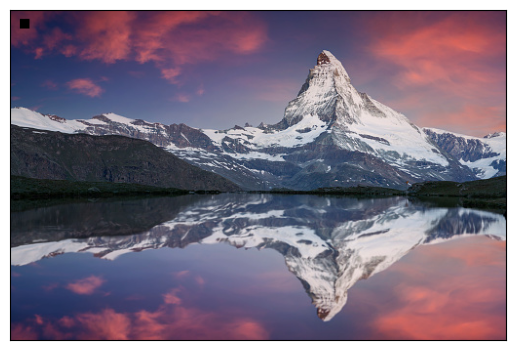

In [6]:
img[pixel_row:pixel_row+region_size, pixel_col:pixel_col+region_size] = [0, 0, 0]
display_image(img)
plt.show()

**QUESTION:** (/1)

In the next cell, change the color of the pixels to white in a rectangle of size (40, 100) starting from the pixel (30, 60) and show the new image.

Pixel value at location 30x60 is [79 46 80]
Region size is (40, 100, 3)
New pixel value at location 30x60 is [255 255 255]


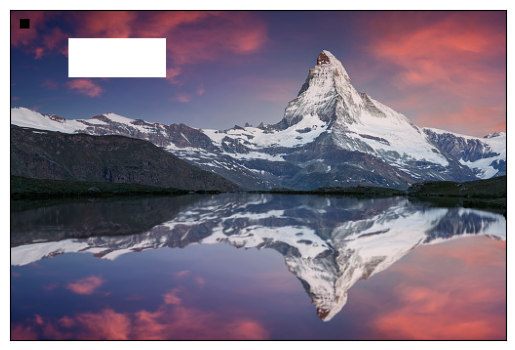

In [7]:
# modifying pixel value

## YOUR CODE HERE
pixel_row = 30
pixel_col = 60

# accessing pixel (pixel_x, pixel_y) 
print('Pixel value at location {}x{} is {}'.format(pixel_row, pixel_col, img[pixel_row, pixel_col]))

row_region = 40
col_region = 100

img_region = img[pixel_row:pixel_row+row_region, pixel_col:pixel_col+col_region]
print('Region size is {}'.format(img_region.shape))

# modifying pixel value
img[pixel_row, pixel_col] = [255, 255, 255]
img[pixel_row:pixel_row+row_region, pixel_col:pixel_col+col_region] = [255, 255, 255]
print('New pixel value at location {}x{} is {}'.format(pixel_row, pixel_col, img[pixel_row, pixel_col]))

# Display the modified image with white rectangle
display_image(img)

### 1.1.2 Colorspace Conversion

Now, you will learn how to convert images from one colorspace to another, like BGR ↔ Gray, BGR ↔ YUV etc. There are more than 150 color-space conversion methods available in OpenCV. 

**QUESTION:** (/4)

In the next two cells, implements the conversion function going from BGR image to GRAY image and BGR to YUV image. There are built-in functions in OpenCV doing exactly that but for the moment we'll ask you to implement your **own** function in order to get the idea of what is happening under the hood.

In [8]:
def convert_bgr_to_grayscale(frame):
    """
    Convert a given bgr image into grayscale image
    :param frame: Color image to convert
    :return: Grayscale image as numpy array
    """
    
    # YOUR CODE HERE
    image = frame[:, :, 0] * 0.114 + frame[0, 0, 1] * 0.587 + frame[0, 0, 2] * 0.299
    
    return image.astype(np.float32)

In [9]:
def convert_bgr_to_yuv(frame):
    """
    Convert a given rgb image into hsv image
    :param frame: Color image to convert
    :return: YUV image as numpy array
    """
    
    # YOUR CODE HERE
    image = np.zeros(frame.shape, dtype=np.float32)
    image[:, :, 0] = (frame[:, :, 0] * 0.114) + (frame[:, :, 1] * 0.587) + (frame[:, :, 2] * 0.299)
    image[:, :, 1] = 0.493 * (frame[:, :, 0] - image[:, :, 0])
    image[:, :, 2] = 0.877 * (frame[:, :, 2] - image[:, :, 0])

    image[:, :, 0] = np.clip(image[:, :, 0], 0, 255)
    
    # Normally, the U & V channels are centered around 0, or rather in the range [-127, 128], and we need to convert that range to [0, 255]
    image[:, :, 1] += 128
    image[:, :, 2] += 128

    return image.astype(np.uint8)

The following lines shows the conversion based on your implementation and the built-in function from OpenCV. If everything went well, the two should match.

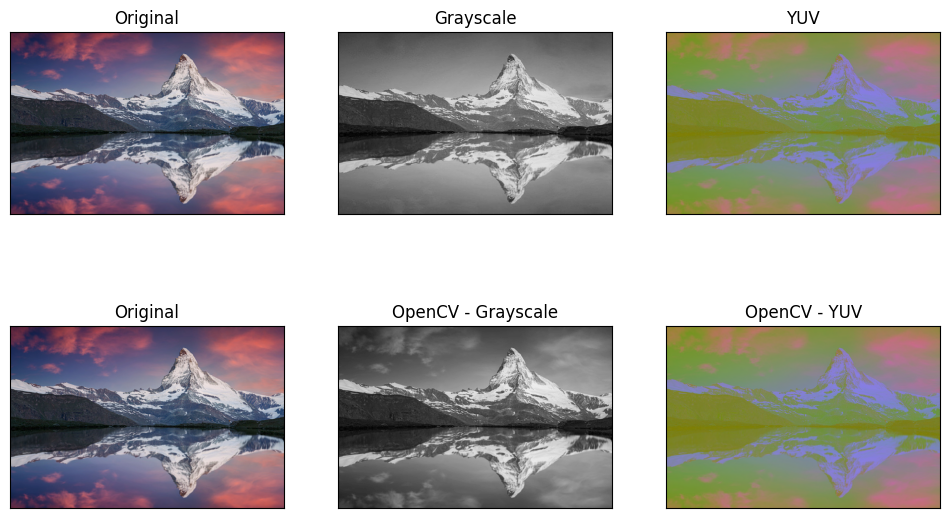

In [10]:
# Load image
img = cv.imread(os.path.join('.', 'data', 'matterhorn.jpg'))
# convert to gray + hsv
img_gray = convert_bgr_to_grayscale(img)
img_yuv = convert_bgr_to_yuv(img)
gt_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gt_yuv = cv.cvtColor(img, cv.COLOR_BGR2YUV)
# Display
fig, ax = plt.subplots(2, 3, figsize=(12, 7))
display_image(img, axes=ax[0][0])
ax[0][0].set_title('Original')
display_image(img_gray, axes=ax[0][1])
ax[0][1].set_title('Grayscale')
display_image(img_yuv, axes=ax[0][2])
ax[0][2].set_title('YUV')

display_image(img, axes=ax[1][0])
ax[1][0].set_title('Original')
display_image(gt_gray, axes=ax[1][1])
ax[1][1].set_title('OpenCV - Grayscale')
display_image(gt_yuv, axes=ax[1][2])
ax[1][2].set_title('OpenCV - YUV');
plt.show()

Now you know how to convert *BGR* image to any color space, you can use this to extract a colored object. In *HSV*, it is more easier to represent a color than in *BGR* colorspace. Here is the method to extract a colored object:

1. Reading an input image
2. Convert from *BGR* to *HSV* color-space using bluit-in function from OpenCV
3. We threshold the *HSV* image to extract the pixels in the desired color range. 

**QUESTION:** (/2)

First, implement the function `threshold_bgr_image()` to threshold the color image in the desired color range. 

**Hint**: You may use the OpenCV functions `inRange()` and `bitwise_and()`.

In [11]:
def threshold_bgr_image(frame, lower, upper):
    """
    Segment image.
        1. Convert image to HSV color space
        2. Find pixels in the desired color range (lower, upper)
        3. Apply the mask to the image. 
    :param frame: BGR image to segment
    :param lower: Lower threshold value
    :param upper: Upper threshold value
    :return res: Segmented image
    :return mask: binary mask
    """
    converted = cv.cvtColor(frame, cv.COLOR_BGR2HSV)
    mask = cv.inRange(converted, lower, upper)
    res = cv.bitwise_and(frame, frame, mask=mask)
    
        
    return res, mask

The next cell test your function on the blue pixels of the image.

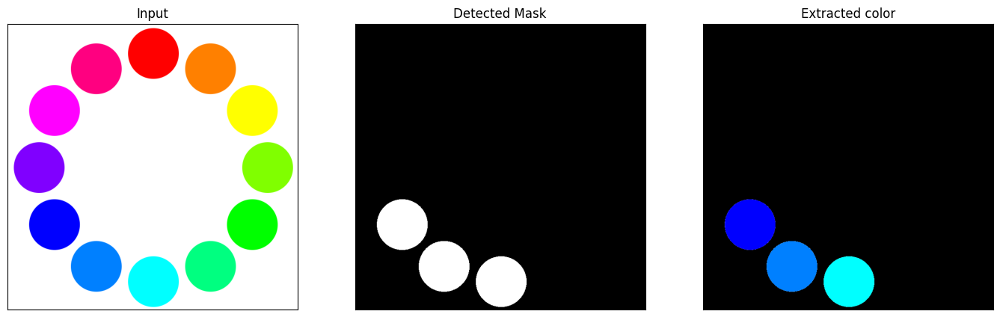

In [12]:
# 1. Read input
img = cv.imread(os.path.join('data', 'circles_color.png'))

# 2. Define range of blue color in HSV
lower = np.asarray([90,120,120])
upper = np.asarray([130,255,255])
im, mask = threshold_bgr_image(img, lower, upper)

# 3. Display using subplots
fig, ax = plt.subplots(1, 3, figsize=(17, 9))
display_image(img, axes=ax[0])
ax[0].set_title('Input')
display_image(mask, axes=ax[1], cmap='gray')
ax[1].set_title('Detected Mask')
display_image(im, axes=ax[2])
ax[2].set_title('Extracted color')
plt.show()

In order to find *HSV* values, you can use the same function, `cv.cvtColor()`. Instead of passing an image, you just pass the *BGR* values you want. The next cell shows an example to find the HSV value of red. 

In [13]:
red = np.uint8([[[0, 0, 255 ]]])
hsv_red = cv.cvtColor(red, cv.COLOR_BGR2HSV)
print( 'HSV component {}'.format(hsv_red))

yellow = np.uint8([[[0, 255, 255 ]]])
hsv_yellow = cv.cvtColor(yellow, cv.COLOR_BGR2HSV)
print( 'HSV component {}'.format(hsv_yellow))

HSV component [[[  0 255 255]]]
HSV component [[[ 30 255 255]]]


**QUESTION:** (/2)

Try to extract the **Yellow** circle. Comment and show the result.


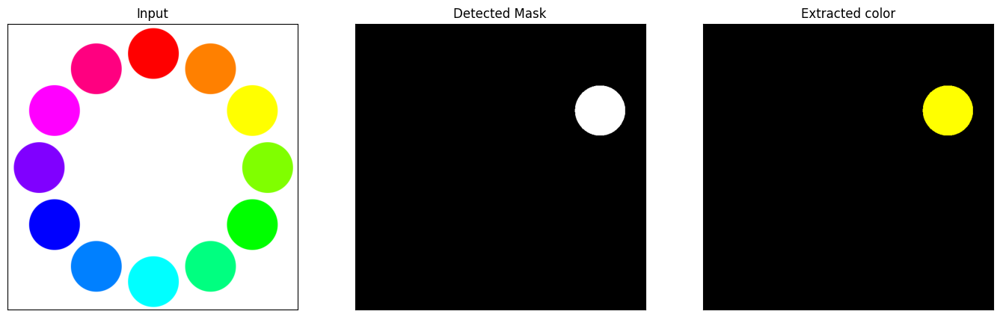

In [14]:
# 1. Read input
img = cv.imread(os.path.join('data', 'circles_color.png'))

# 2. Extract yellow color in HSV

### Your code here ### 
lower = np.asarray([30, 255, 100])
upper = np.asarray([30, 255, 255])

im, mask = threshold_bgr_image(img, lower,upper)



# 3. Display using subplots
fig, ax = plt.subplots(1, 3, figsize=(17, 9))
display_image(img, axes=ax[0])
ax[0].set_title('Input')
display_image(mask, axes=ax[1], cmap='gray')
ax[1].set_title('Detected Mask')
display_image(im, axes=ax[2])
ax[2].set_title('Extracted color')
plt.show()

**YOUR ANSWER**

So far you have been working with color image, but you could apply the same approach with the grayscale image.

**QUESTION:** (/2)

Now, try to extract the **yellow** pencil using the grayscale image. What are the pros and cons of each method (colors *vs* grayscale)?

In [15]:
yellow = np.uint8([[[0, 255, 255 ]]])
gray_yellow = cv.cvtColor(yellow, cv.COLOR_BGR2GRAY)
print( 'Gray component {}'.format(gray_yellow))

yellow_ = np.uint8([[[0, 100, 100 ]]])
gray_yellow_ = cv.cvtColor(yellow_, cv.COLOR_BGR2GRAY)
print( 'Gray component {}'.format(gray_yellow_))

Gray component [[226]]
Gray component [[89]]


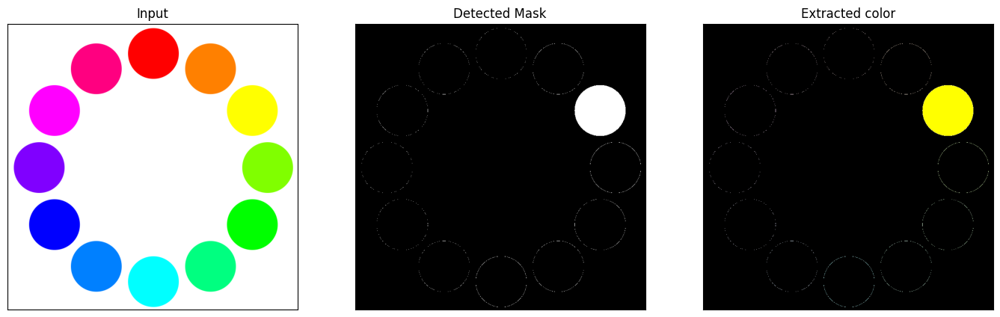

In [16]:
def threshold_gray_image(frame, lower, upper):
    """
    Segment image.
        1. Convert image to gray color space
        2. Find pixels in the desired color range (lower, upper)
        3. Apply the mask to the image. 
    :param frame: BGR image to segment
    :param lower: Lower threshold value
    :param upper: Upper threshold value
    :return: Segmented image, binary mask
    """
    
    # YOUR CODE HERE
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    mask = cv.inRange(gray, lower, upper)
    res = cv.bitwise_and(frame, frame, mask=mask)
    
    return res, mask

# 1. Read input
img = cv.imread(os.path.join('data', 'circles_color.png'))

# 2. Extract yellow color in gray


# YOUR CODE HERE
lower = np.asarray([225])
upper = np.asarray([250])
im, mask = threshold_gray_image(img, lower, upper)
    
    
# 3. Display using subplots
fig, ax = plt.subplots(1, 3, figsize=(17, 9))
display_image(img, axes=ax[0])
ax[0].set_title('Input')
display_image(mask, axes=ax[1], cmap='gray')
ax[1].set_title('Detected Mask')
display_image(im, axes=ax[2])
ax[2].set_title('Extracted color')
plt.show()

**YOUR ANSWER**

- For Grayscale images:

    Pros:

    + Simplicity & Speed, since we are processing a single channel, and it is much faster and less computationally expensive than processing three channels.
    + It simplifies problems by removing colours, which is usefule for tasks like edge detection, corner detection and identifying shapes, where colours adds unnecessary complexity.
    + Less sensitive to illumination, since the grayscale space is inherently robust to certain lighting changes, since it only cares about luminance.

    Cons:

    - The critical drawback is that there is not colour information. A bright red pixel and bright blue pixel can have the exact same grayscale values, therefore it is impossible to distinguish or extract specific colours from a grayscale image.
    - There is also the fact that the lower and upper bounds have to be as precise as possible, since there are not really many "mixtures" to achieve the wanted colour, so we should have prior knowledge of the wanted colour and try to cover the whole `BGR` range of this colour and convert it to the `Grayscale` space to get any shade of the colour.


- For HSV images:

    Pros:

    + Decouples intensity from colour, the `Hue` channel, represents the pure colour, so we can easily select the range for blue and it will work whatever the shade, this makes it highly robust to shadows and lighting changes.
    + Intuitive colour selection, making it easy to define a threshold for a specific colour by setting ranges for its Hue, Saturation (intensity) & Value (brightness).

    Cons:
    
    - Computationally slower, since converting an image from `BGR` to `HSV` (or `YUV`) colour space requires more computation than converting to grayscale, as well as the fact that the computation of the bounds involves three channels.
    - `Hue` can become unstable for pixels with very low saturation (gray/whites) or low value (blacks), it can easily get noisy and unreliable.
    - `YUV` is less intuitive, so we would need to convert the `BGR` colours to the `YUV` to get the right ranges, since mental conversion isn't as easy as it sounds.


### 1.1.3 Image Histogram

An histogram is a graph or plot, which gives you an overall idea about the intensity distribution of the pixels of the image. It is just another way of understanding the image. By looking at the histogram of an image, you get intuition about contrast, brightness, intensity distribution etc of that image. Almost all image processing tools today, provides features on histogram.

**QUESTION:** (/1)

In the next cell, implement a function using OpenCV that computes the image histogram for all channels.

In [17]:
def compute_image_histogram(image):
    """
    Compute image color distribution for each channels of a given `image`
    :param image: Image to extract histograms for
    :return: List of histogram, one per channel.
    """
    hist = []
    
    # YOUR CODE HERE
    if len(image.shape) == 3:
        for i in range(image.shape[2]):
            hist.append(cv.calcHist([image], [i], None, [256], [0, 256]))
    else:
        hist.append(cv.calcHist([image], [0], None, [256], [0, 256]))


    return hist

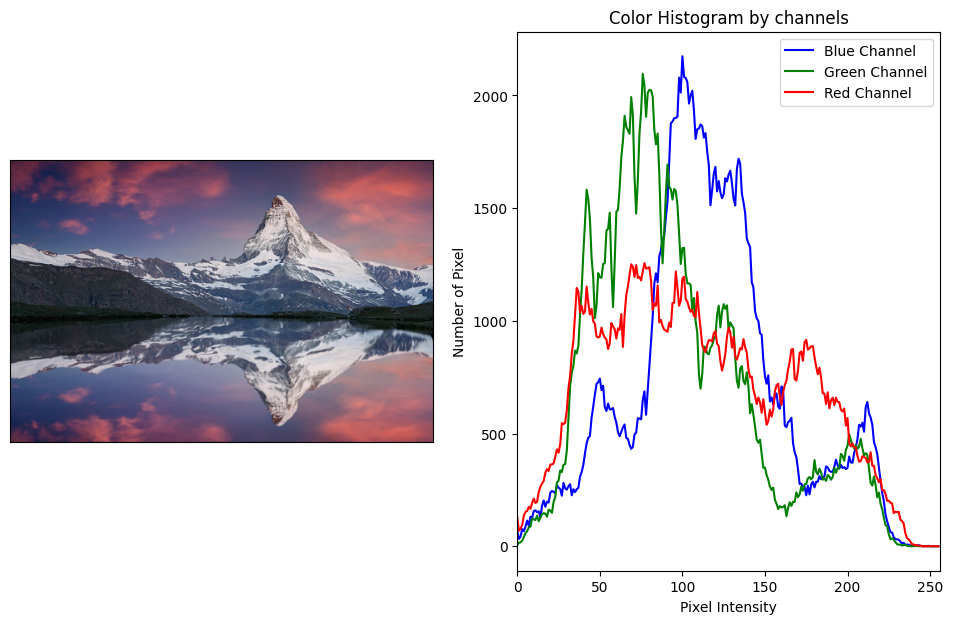

In [18]:
# 1. Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'))

# 2. Compute histogram for each channels
hists = compute_image_histogram(img)

# 3. Plot 
color = ['b', 'g', 'r']
fig, ax = plt.subplots(1, 2, figsize=(12, 7))
display_image(img, axes=ax[0])
for k, hist in enumerate(hists):
    ax[1].plot(hist, color=color[k])
ax[1].set_title('Color Histogram by channels')
ax[1].set_xlim([0, 256])
ax[1].set_xlabel('Pixel Intensity')
ax[1].set_ylabel('Number of Pixel')
plt.legend(['Blue Channel', 'Green Channel', 'Red Channel'])
plt.show()

You can see the image and the corresponding histograms.

**QUESTION:** (/1)

What is the significant of the pixel intensity?


**YOUR ANSWER** 

The histogram shows how many pixels have what intensity for each channel (colour), so it shows the overall idea about the image, about the pixel colour intensity distribution over all of the image.

#### Histogram equalization
Consider an image whose pixel values are confined to some specific range of values only. For instance, brighter image will have all pixels confined to high values. But a good image will have pixels from all regions of the image. So you need to stretch this histogram to either ends and that is what Histogram Equalization does. This normally improves the contrast of the image ([doc](https://en.wikipedia.org/wiki/Histogram_equalization)).

**QUESTION:** (/3)

In the next section implement such contrast enhancement function (i.e. based on histogram equalization)

In [19]:
def contrast_enhancement(image):
    """
    Compute histogram and apply histogram equalization on a given image.
    :param image: Image to enhance contrast
    :return: tuple: enhanced image, input image histogram, transformed image histogram
    """
    
    hist = None
    hist_equ = None
    image_equ = None
    
    # Apply histogram equalization
    hist = cv.calcHist([image], [0], None, [256], [0, 256])
    image_equ = cv.equalizeHist(image)
    hist_equ = cv.calcHist([image_equ], [0], None, [256], [0, 256])

    return image_equ, hist, hist_equ

The next cell shows you the results of histogram equalization on an image. 

**QUESTION:** (/2)

- How has the contrast evolved after applying the transformation ? 
- How has the histogram changed ?

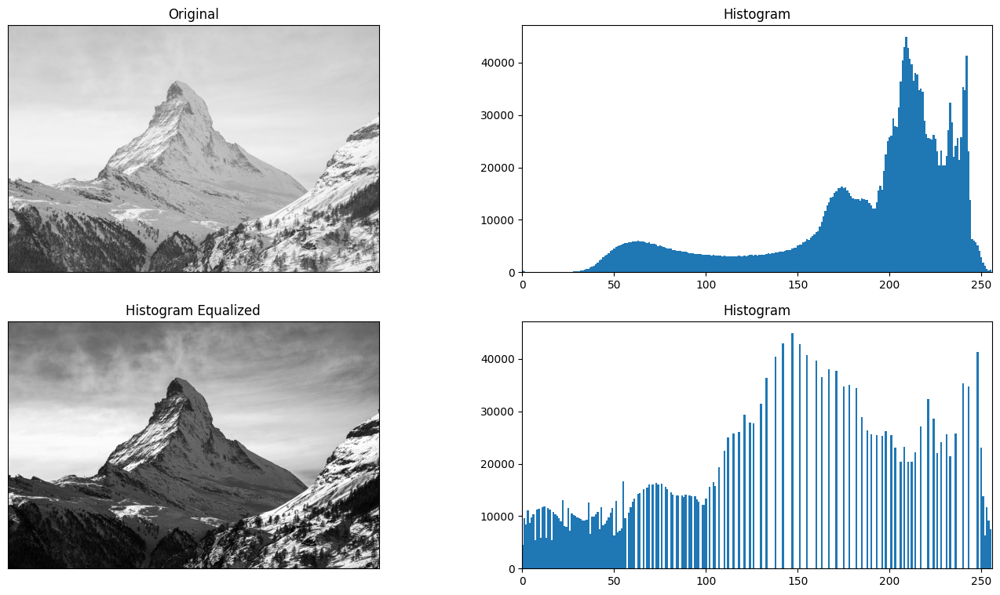

In [20]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn_snow.jpg'), cv.IMREAD_GRAYSCALE)

# Enhance contrast with histogram equalization
img_equ, hist, hist_equ = contrast_enhancement(img)

# Display
fig, ax = plt.subplots(2, 2, figsize=(17, 9))
display_image(img, axes=ax[0][0])
ax[0][0].set_title('Original')
# Histogram original
ax[0][1].bar(np.arange(hist.shape[0]), hist.reshape(-1),  width=1)
ax[0][1].set_xlim([0, 256])
ax[0][1].set_title('Histogram')
# Histogram equalized
display_image(img_equ, axes=ax[1][0])
ax[1][0].set_title('Histogram Equalized')
ax[1][1].bar(np.arange(hist_equ.shape[0]), hist_equ.reshape(-1),  width=1)
ax[1][1].set_xlim([0, 256])
ax[1][1].set_title('Histogram')
plt.show()


**YOUR ANSWER**

+ The contrast now is much stronger in the equalized image. Its components are much clearer to see, and to tell apart.

+ The histogram now has more pixels in the low intensity ranges. Or more specifically, the pixel intensity distribution is much more well rounded now, more towards the middle and the lower part, while the high part has less pixels than before, giving more meaning to "Histogram Equalization" in the literal sense

### 1.2 Image filtering and edges detection

(50 points)

Image filtering is a two-dimensional convolution of the image by a small matrix called kernel. The choice of the kernel depends on the goal of the filtering operation, which can be noise removal, edge detection, contrast enhancement, etc. In general, filters are classified into two families: low-pass filters and high-pass filters. 
 
### 1.2.1 Low-pass filters 

The most common low-pass filters are the [averaging filter](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga8c45db9afe636703801b0b2e440fce37), the [Gaussian filter](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1) and the [median filter](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga564869aa33e58769b4469101aac458f9). 

**QUESTION:** (/3)

In the next cell, implement the function `apply_lowpass_filter()`, which takes as input an image, and the filter parameters in a dictionary (filter type and size) and returns the filtered image. Use the corresponding OpenCV functions. 


In [21]:
def apply_lowpass_filter(img, filter_params):
    """
    Apply a low-pass filter on a given image.
    :param image: Image to enhance contrast
    :param filter_params: Parameters of the filter
    :return: img_filt: filtered image
    """
    
    # YOUR CODE HERE
    kernel_size = filter_params.get('fsize', 7)
    filter_type = filter_params.get('ftype', 'gaussian')

    if filter_type == 'averaging':
        img_filt = cv.blur(img, (kernel_size, kernel_size))
    elif filter_type == 'gaussian':
        img_filt = cv.GaussianBlur(img, (kernel_size, kernel_size), 0)
    elif filter_type == 'median':
        img_filt = cv.medianBlur(img, kernel_size)
    else:
        raise ValueError("Unsupported filter type. Use 'averaging', 'gaussian', or 'median'.")
    
    
    return img_filt


The next cell tests your implementation on two images corrupted by a different noise, with a filter of size (7x7). 

**QUESTION:** (/2)

What is the effect of each filter? How different are the filtered images? Which filter is the best for each image and why? 

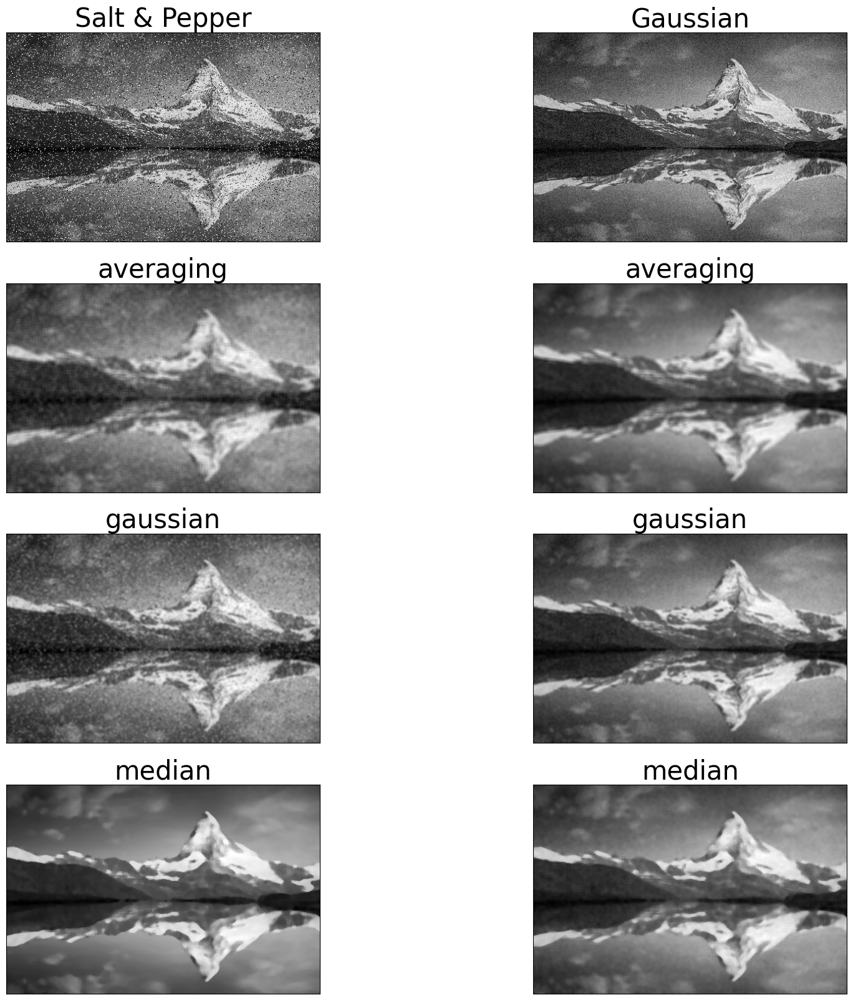

In [23]:
# Load image
imgs = [cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE), cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]
img_title = ["Salt & Pepper", "Gaussian"]

# Filtering with a kernel of size 7x7
filter_size = 7 
filter_params = [ {"ftype":"averaging", "fsize":filter_size},
                 {"ftype":"gaussian", "fsize":filter_size},
                 {"ftype":"median", "fsize":filter_size}]


# Display image
fig, ax = plt.subplots(len(filter_params)+1, len(imgs), figsize=(20, 20))

for curr_img_idx, curr_img in enumerate(imgs):
    display_image(curr_img, axes=ax[0, curr_img_idx], cmap='gray')
    
    ax[0, curr_img_idx].set_title(img_title[curr_img_idx], fontsize=30)

    for curr_filt_idx, curr_filt in enumerate(filter_params):        
        img_filt = apply_lowpass_filter(curr_img, curr_filt)
        display_image(img_filt, axes=ax[curr_filt_idx+1, curr_img_idx], cmap='gray')
        ax[curr_filt_idx+1, curr_img_idx].set_title(curr_filt["ftype"], fontsize=30)
plt.show()


**YOUR ANSWER**

+ ***Average Filter:***
    - Takes the average of the neighbouring kxk pixels, which smoothes out the image, reduces the noise, but at the cost of blurring the edges and fine details.
    - Blurry for both images.

+ ***Gaussian Filter:***
    - Instead of taking the average, it uses a gaussian (Bell-shaped) weights around the center (concerned) pixel. It is significantly better with edges and fine details than the average filter.
    - Good with the gaussian noise image (Expected, since gaussian noise added to it.). Looks like a snowstorm for the salt & pepper-noised image.

+ ***Median Filter:***
    - Replaces the pixel value with the median value in its neighbourhoud. Since the median is not sensitive to extreme values, it removes outlier-based noise.
    - It ignored the black & white pixels, so it produces "good" and acceptable results for both images.

Now that you are able to filter an image, let's find the optimal kernel. In this question, we consider the optimal filter to be the one that produces a filtered image that is visually closest to the image without noise.

**QUESTION:** (/4)

For each image, propose an optimal kernel (type and size), justify your choice and show the filtered image. 

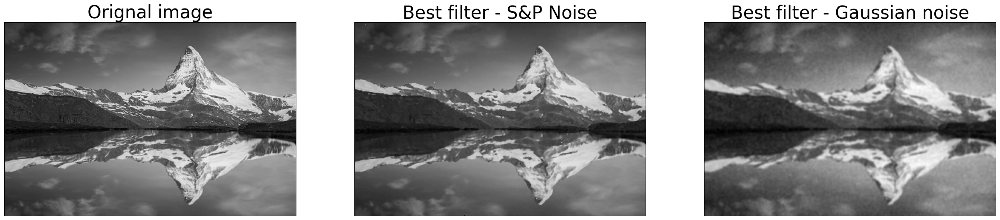

In [42]:
# Load image
img_orig = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)
imgs = [cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE), cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]
img_title = ["Salt & Pepper", "Gaussian"]

# Best filter parameters


###################
# YOUR CODE HERE
best_filter_params_1 = {"ftype" : 'median', "fsize" : 3}
best_filter_params_2 = {"ftype" : 'gaussian', "fsize" : 7}
###################


# Filtering
img1_best = apply_lowpass_filter(imgs[0], best_filter_params_1)
img2_best = apply_lowpass_filter(imgs[1], best_filter_params_2)

# Display image
fig, ax = plt.subplots(1, 3, figsize=(30, 10))
display_image(img_orig, axes=ax[0], cmap='gray')
ax[0].set_title("Orignal image", fontsize=30)
display_image(img1_best, axes=ax[1], cmap='gray')
ax[1].set_title("Best filter - S&P Noise", fontsize=30)
display_image(img2_best, axes=ax[2], cmap='gray')
ax[2].set_title("Best filter - Gaussian noise", fontsize=30)
plt.show()


### 1.2.2 High-pass filters

The second family of filters are the high-pass filters. You will try two of them: the first-order [Sobel filter](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gacea54f142e81b6758cb6f375ce782c8d) and the second order [Laplacian filter](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gad78703e4c8fe703d479c1860d76429e6).

We start with the first-order Sobel filter, more info is available in the [doc](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gacea54f142e81b6758cb6f375ce782c8d). When using first-order filters, the kernel is applied in one direction, along the rows or the columns of the image. 

**QUESTION:** (/2)

In the next cell, implement the function `apply_sobel_filter` which takes as input an image, the
direction of filtering (`x` or `y`), and the filter size  and returns the filtered image. Use the corresponding OpenCV function with the parameter `ddepth=cv.CV_64F`. 


In [43]:
def apply_sobel_filter(img, direction, filter_size):
    
    """
    Apply the sobel filter on a given image.
    :param img: Image to enhance contrast
    :param direction: Direction of the derivative
    :param filter_size: Size of the filter
    :return: img_filt: filtered image
    """
    
    # YOUR CODE HERE
    if direction == 'x':
        dx, dy = 1, 0
    elif direction == 'y':
        dx, dy = 0, 1
    else:
        raise ValueError("Direction must be 'x' or 'y'")
    
    img_filt = cv.Sobel(img, cv.CV_64F, dx, dy, ksize=filter_size)
    
    return img_filt

The next cell tests your implementation with a filter of size (7x7) in both directions. 

**QUESTION:** (/2)

What are the differences between the filtered images? Why? 


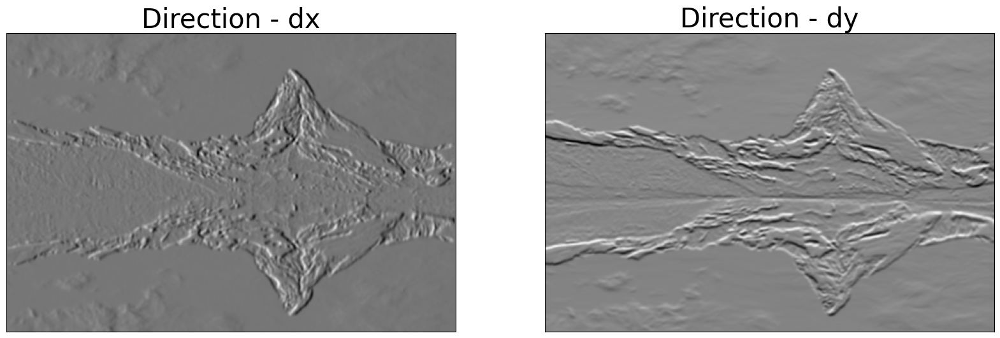

In [45]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)

# Sobel filtering
filter_size = 7

img_sobel_dx = apply_sobel_filter(img, "x", filter_size)
img_sobel_dy = apply_sobel_filter(img, "y", filter_size)

fig, ax = plt.subplots(1, 2, figsize=(20, 10))
display_image(img_sobel_dx, axes=ax[0], cmap='gray')
ax[0].set_title("Direction - dx", fontsize=30)
display_image(img_sobel_dy, axes=ax[1], cmap='gray')
ax[1].set_title("Direction - dy", fontsize=30)
plt.show()



**YOUR ANSWER**

+ For the Sobel filter, for the dx derivative, the filter emphasizes on the vertical edges. This is the literal meaning of the derivative on the x-axis, meaning that when it detects a sharp change in the intensity on the horizontal axis, it appears brighter in the filtered image.

+ The same goes for the dy derivative, the second filtered image, the filter emphasizes on the horizontal edges. Since the derivative computed is on the y-axis, the filter has a detected sharp intensity change on the vertical axis appearing brighter in the filtered image.

Now, you will implement a second-order high-pass filter, the [Laplacian filter](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gad78703e4c8fe703d479c1860d76429e6). 

**QUESTION:** (/1)

In the next cell, implement the function `apply_laplacian_filter` which takes as input an image, and the filter size and returns the filtered image. Use the corresponding OpenCV function with the parameter `ddepth=cv.CV_64F`.  


In [46]:
def apply_laplacian_filter(img, filter_size):
    """
    Apply a laplace filter on a given image.
    :param img: Image to enhance contrast
    :param filter_size: Size of the filter
    :return: img_filt: filtered image
    """
        
    # Laplacian filtering
    
    # YOUR CODE HERE
    img_filt = cv.Laplacian(img, cv.CV_64F, ksize=filter_size)
    
    return img_filt

The next cell tests your implementation with filters of size (1x1), (5x5) and (11x11). 

**QUESTION:** (/2)

What are the differences between the filtered images? Why? 


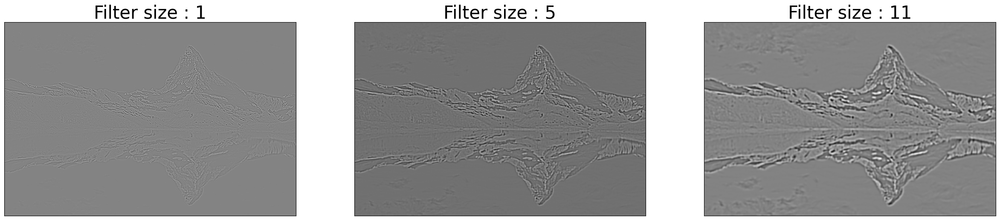

In [47]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)

# Laplacian filtering
filter_size = [1, 5, 11]

fig, ax = plt.subplots(1, len(filter_size), figsize=(10*len(filter_size), 10))

for curr_filt_idx, curr_filt_size in enumerate(filter_size):
    img_laplacian = apply_laplacian_filter(img, curr_filt_size)
    display_image(img_laplacian, axes=ax[curr_filt_idx], cmap='gray')
    ax[curr_filt_idx].set_title("Filter size : {}".format(curr_filt_size), fontsize=30)

plt.show()



**YOUR ANSWER**

The Laplacian filter is highly dependant on the kernel size (ie. the size of the convolution window). Since it determines how much local neighbourhoud information is used to compute the second derivative of a given pixel.

+ Kernel size = 1 (1x1 filter)
    - A small kernel, that captures local intensity changes (highly sensitive), giving out thin edge responses.
    - The smoothing is almost not even done, resulting in a 'noisier' image in the sense that it has very fine edge details.

+ Kernel size = 5 (5x5 filter)
    - A larger kernel, smoothes out the image over a broader neighbourhood before taking the second derivative.
    - Edges appear a bit thicker or less sharp, but some small-scale noise is reduced.

+ Kernel size = 11 (11x11 filter)
    - An ever larger kernel, smoothes out the image over an even broader neighbourhood, emphasizing global structures.
    - Edges become thicker (less sharp), very fine details disappear and the image appears blurrier.


+ ***Explanation:***
The Laplacian filter uses the kernel to smooth out the image before taking the derivative. The main purpose of it is to highlight areas of high intensity changes (edges). Bigger kernels make edges thicker and reduces high-frequency noise. Smaller kernels preserve finer details (& noise) but produces thinner and more localised edges.

It is convenient to have one function for applying a high-pass filter, similarly to the function `apply_lowpass_filter()`. 

**QUESTION:** (/2)

In the next cell, implement the function `apply_highpass_filter()`, which takes as input an image and a dictionary of the filter parameters, and returns the filtered image. Use the functions you implemented in the previous cells. 

In [48]:
def apply_highpass_filter(img, filter_params):
    
    """
    Apply a highpass filter on a given image.
    :param image: Image to enhance contrast
    :param filter_params: Parameters of the filter
    :return: img_filt: filtered image
    """
    
    # YOUR CODE HERE
    if filter_params.get('ftype') == 'sobel':
        direction = filter_params.get('direction', 'x')
        filter_size = filter_params.get('fsize', 7)
        img_filt = apply_sobel_filter(img, direction, filter_size)
    elif filter_params.get('ftype') == 'laplacian':
        filter_size = filter_params.get('fsize', 1)
        img_filt = apply_laplacian_filter(img, filter_size)
    else:
        raise ValueError("Unsupported filter type. Use 'sobel' or 'laplacian'.")
    
    return img_filt



The next cell tests your implementation with an example of each high-pass filter. 

**QUESTION** (/3)

Comment the differences between the images. 


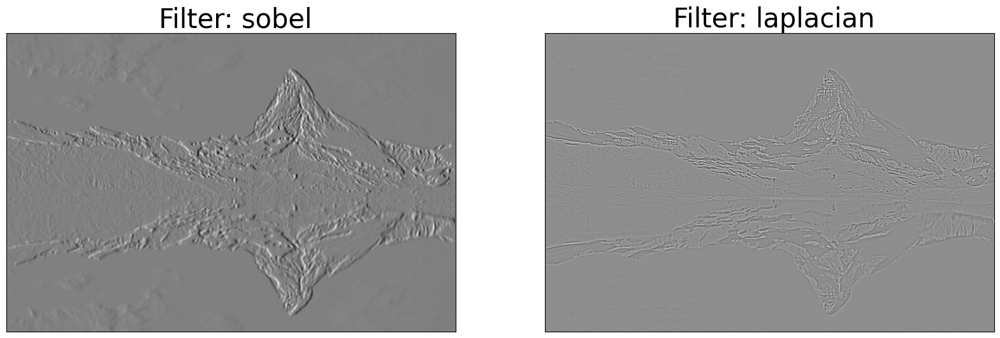

In [49]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)


filter_size = 3

# Sobel filtering
sobel_params = {"ftype":"sobel", "direction": "x", "fsize": filter_size}

# Laplacian filtering 
laplacian_params = {"ftype":"laplacian", "fsize": filter_size}

highpass_params = [sobel_params, laplacian_params]

fig, ax = plt.subplots(1, len(highpass_params), figsize=(10*len(highpass_params), 10))

for curr_highpass_idx, curr_highpass_params in enumerate(highpass_params):
    img_filt = apply_highpass_filter(img, curr_highpass_params)
    display_image(img_filt, axes=ax[curr_highpass_idx], cmap='gray')
    ax[curr_highpass_idx].set_title(" Filter: {}".format(curr_highpass_params["ftype"]), fontsize=30)

plt.show()



+ ***Sobel Filter:***

The sobel filter computes the gradient of the image in a given direction (vertical & horizontal). It highlights the edges in the given direction (boundaries), making it easier to detect the boundaries of objects (namely for object detection, recognition & image segmentation).

+ ***Laplacian Filter:***

The laplacian filter is a second-order, edge-detection operator that highlights regions of rapid intensity change in an image by approximating the Laplacian of the image's intensity function. It works by calculating the second spatial derivative of the image, which identifies zero crossings that correspond to edges. There is a gaussian smoothing filter applied of the given kernel size since the laplacian operator is highly sensitive to noise (sensitive to rapid changes in pixel intensity).

+ ***Overview:***

Sobel and Laplacian are edge detection filters that identify sharp changes in image intensity, but they differ in their approach: Sobel is a first-order derivative operator that uses two directional kernels (horizontal and vertical) to find the gradient's magnitude and direction, making it sensitive to noise but providing directional information. The Laplacian, a second-order derivative operator, uses a single symmetrical kernel to highlight edges in all directions, is non-directional, and is more sensitive to noise.

### 1.2.3 Image Thresholding

Image tresholding consist in assigning a new value to a pixel given a threhsold. If the pixel value is greater than the threshold value, it is assigned one value (*maybe white*), else it is assigned another value (*maybe black*). The function used is `cv.threshold(<image>, <thresh>, <maxVal>, <type>)`. First argument is the source image, which should be a grayscale image. Second argument is the threshold value which is used to classify the pixel values. Third argument is the maxVal which represents the value to be given if pixel value is more than (sometimes less than) the threshold value. OpenCV provides different styles of thresholding and it is decided by the fourth parameter of the function. Different types are:

1. `cv.THRESH_BINARY`
2. `cv.THRESH_BINARY_INV`
3. `cv.THRES_TRUNC`
4. `cv.THRESH_TOZERO`
5. `cv.THRESH_TOZERO_INV`

**QUESTION:** (/2)

In the next cell, implement the thresholding operations within the function `threshold_image()`. It takes as input a grayscale image and a dictionary of parameters for the OpenCV function `cv.threshold(<image>, <thresh>, <maxVal>, <type>)`.

In [66]:
def threshold_image(img, thresh_params):
    """
    Apply different type of threshold to a given image + threshold value
    """

    """
    Apply a threshold on a given image.
    :param image: Image to enhance contrast
    :param thresh_params: Parameters of the thresholdinf
    :return: img_thresh: thresholded image
    """    
    
    # YOUR CODE HERE
    thresh_type = thresh_params.get('ttype', cv.THRESH_BINARY)
    thresh_value = thresh_params.get('thresh', 127)
    tvalue = thresh_params.get('value', 255)
    if thresh_type == cv.THRESH_BINARY:
        _, img_thresh = cv.threshold(img, thresh_value, tvalue, thresh_type)
    elif thresh_type == cv.THRESH_BINARY+cv.THRESH_OTSU:
        retval, img_thresh = cv.threshold(img, 0, tvalue, thresh_type)
        print("Optimal threshold value computed using Otsu's method: {}".format(retval))
    elif thresh_type == cv.THRESH_BINARY_INV:
        _, img_thresh = cv.threshold(img, thresh_value, tvalue, thresh_type)
    elif thresh_type == cv.THRESH_TRUNC:
        _, img_thresh = cv.threshold(img, thresh_value, tvalue, thresh_type)
    elif thresh_type == cv.THRESH_TOZERO:
        _, img_thresh = cv.threshold(img, thresh_value, tvalue, thresh_type)
    elif thresh_type == cv.THRESH_TOZERO_INV:
        _, img_thresh = cv.threshold(img, thresh_value, tvalue, thresh_type)
    else:
        raise ValueError("Unsupported threshold type. Use 'cv.THRESH_BINARY', 'cv.THRESH_BINARY_INV', 'cv.THRESH_TRUNC', 'cv.THRESH_TOZERO', or 'cv.THRESH_TOZERO_INV'.")
    
    return img_thresh

The next cell tests your implementation. 

**QUESTION:** (/2)

Comment the results.

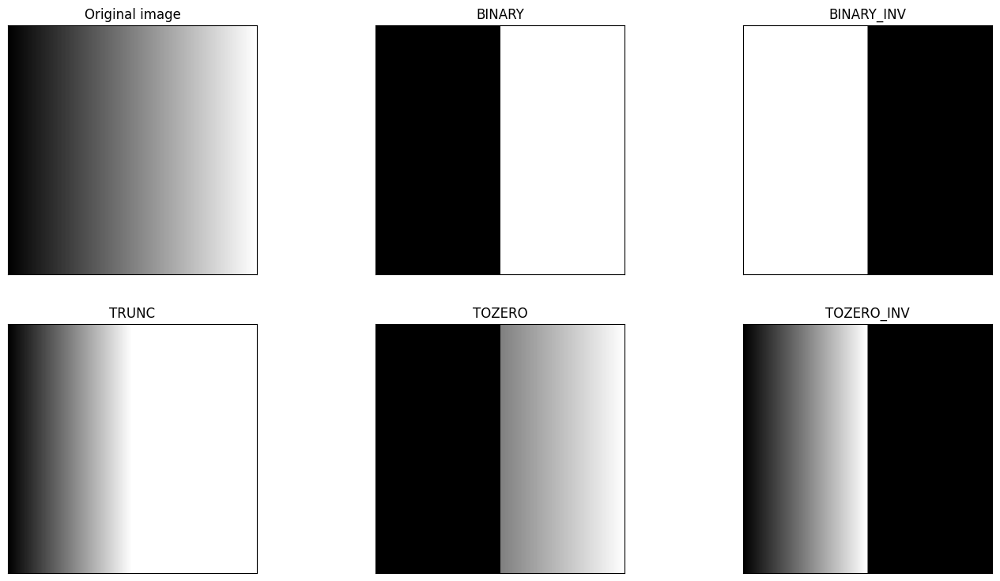

In [67]:
# Load image
img = cv.imread(os.path.join('data', 'grad.png'), cv.IMREAD_GRAYSCALE)

# Various threshold output
thresh  = 127 
tvalue  = 255

thresh_type = [cv.THRESH_BINARY, cv.THRESH_BINARY_INV, cv.THRESH_TRUNC, cv.THRESH_TOZERO, cv.THRESH_TOZERO_INV]

thresh_titles = ['BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']


fig, ax = plt.subplots(2, 3, figsize=(17, 9))
display_image(img, axes=ax[0][0], cmap='gray')
ax[0][0].set_title("Original image")

for curr_thresh_idx, curr_tthresh in enumerate(thresh_type):

    thresh_params = {"ttype": curr_tthresh, 'thresh':thresh, 'value': tvalue}
    thresh_img = threshold_image(img, thresh_params)

    # Draw each samples
    k=curr_thresh_idx+1
    r = int(k / 3)
    c = k % 3
    display_image(thresh_img, axes=ax[r][c], cmap='gray')
    ax[r][c].set_title(thresh_titles[curr_thresh_idx])



**YOUR ANSWER**

+ ***Binary:***

    `Binary Thresholding` is taking the threshold, and whichever pixel has a value below the threshold is turned into `0`, while all pixels with values above the threshold take the `max value`. Exactly why the image is half black (for pixels with intensity values below the threshold), and half white (or rather the `max value` being `255`) for all pixels with intensity values above the threshold.

+ ***Binary Inverted:***

    `Binary Inverted Thresholding` is the exact same as `Binary Thresholding`, but rather inverted, so whichever pixel has a value above the threshold is turned into `0`, while all pixels with values below the threshold take the `max value`. Exactly why the image is half white (or rather the `max value`) (for all pixels with intensity values below the threshold), and half black (for all pixels with intensity values above the threshold).

+ ***Truncate:***

    `Truncate Thresholding` is comparing all pixels values to the threshold value, all pixels with values below the threshold are kept unchanged as the original source grayscale image, while all pixels with values above the threshold are changed to the `max value`. Exactly why the image is half untouched, since half the image has intensities below the threshold, and the other half is all white (or rather the `max value`), for all pixels above the given threshold.

+ ***To Zero:***

    `To Zero Thresholding` is comparing all pixel values to the threshold value, all pixels with values below the given threshold are changed into `0`, while all pixels with values above the given threshold are kept unchanged, with the same values as the original source grayscale image. Exactly why the image is half black (for all pixels with values below the threshold value), and the other half is kept unchanged as the original source grayscale image.

+ ***To Zero Inverted:***

    `To Zero Inverted Thresholding` is the exact same as `To Zero Thresholding`, but rather inverted, so all pixels with values above the given threshold are changed into `0`, while all pixels with values below the given threshold are kept unchanged, with the same vlaues as the original source grayscale image. Exactly why the image is half black (for all pixels with values above the threshold value), and the other half is kept unchanged as the original source grayscale image.


#### Otsu Binarization

In global thresholding, we used an arbitrary value for threshold value. How can we know a value we selected is good or not? Answer is, trial and error method. But consider an image whose histogram has two peaks (a bimodal image). For that image, we can approximately take a value in the middle of those peaks as threshold value. That is what Otsu binarization does. In simple words, it automatically calculates a threshold value from image histogram for a bimodal image. (For images which are not bimodal, binarization won’t be accurate.)

For this, our `cv.threshold()` function is used, but pass an extra flag, `cv.THRES_OTSU`. For threshold value, simply pass zero. Then the algorithm finds the optimal threshold value and returns you as the second output, retVal. If Otsu thresholding is not used, retVal is same as the threshold value you used.


Check out below example. Input image is a noisy image. In first case, a global thresholding value of 127 is applied. In second case, Otsu’s thresholding is applied directly. In third case, the image is filtered with a 5x5 gaussian kernel first to remove the noise, then applied Otsu thresholding. See how noise filtering improves the result.

**QUESTIONS:** (/5)
- For the global thresholding (case 1), why did we chose a value of 127? What would be the effect of a smaller threshold ?  Whats is the value of Otsu thresholding?
- What would be the effect of a bigger Gaussian filter, for example 9x9 pixels? 
- In this example, Otsu's thresholding gives very good results. Can you describe an example for which this method fails? 


Optimal threshold value computed using Otsu's method: 114.0
Optimal threshold value computed using Otsu's method: 117.0


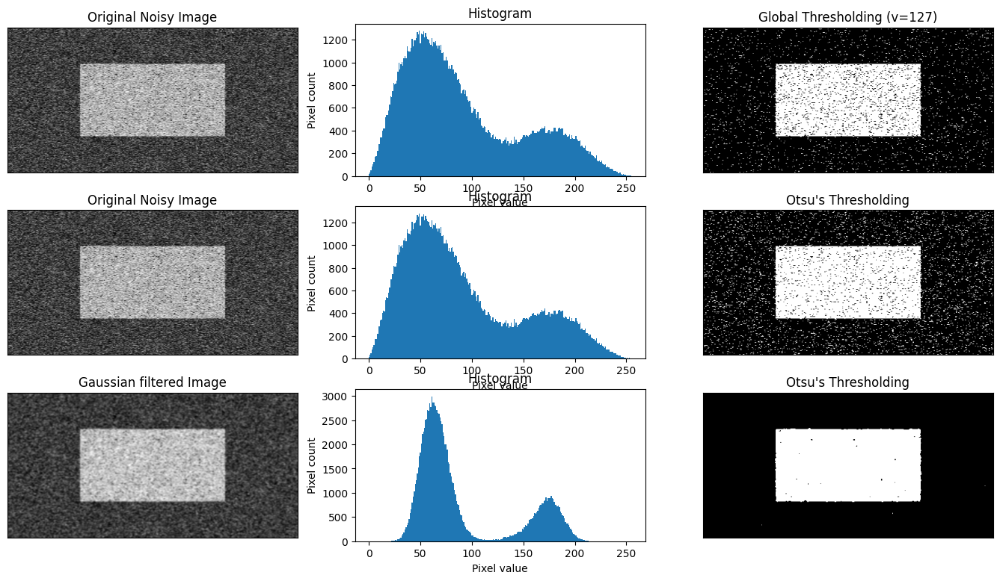

In [72]:
# Load image
img = cv.imread(os.path.join('data', 'noisy2.png'), cv.IMREAD_GRAYSCALE)

tvalue = 255

# 1. Global thresholding
thresh_params = {"ttype": cv.THRESH_BINARY, 'thresh':127, 'value': tvalue}
img_tglobal = threshold_image(img, thresh_params)

# 2. Otsu thresholding
thresh_otsu_params = {"ttype": cv.THRESH_BINARY+cv.THRESH_OTSU, 'thresh':0, 'value': tvalue}
img_totsu = threshold_image(img, thresh_otsu_params)

# 3. Gaussian blurring and Otsu thresholding
thresh_params = {"ttype": cv.THRESH_BINARY+cv.THRESH_OTSU, 'thresh':0, 'value': tvalue}
blur = cv.GaussianBlur(img, (5,5), 0)
img_blur_totsu = threshold_image(blur, thresh_params)

# Compute histograms
hist_g = cv.calcHist([img], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
hist_f = cv.calcHist([blur], channels=[0], mask=None, histSize=[256], ranges=[0, 256])

# plot all the images and their histograms
images = [img, hist_g, img_tglobal,
          img, hist_g, img_totsu,
          blur, hist_f, img_blur_totsu]
titles = ['Original Noisy Image', 'Histogram', 'Global Thresholding (v=127)',
          'Original Noisy Image', 'Histogram', "Otsu's Thresholding",
          'Gaussian filtered Image', 'Histogram', "Otsu's Thresholding"]

# Display
fig, ax = plt.subplots(3, 3, figsize=(17, 9))
for k in range(9):
    r = int(k / 3)
    c = k % 3
    
    if c != 1:
        # Show image
        display_image(images[k], axes=ax[r][c], cmap='gray')
        ax[r][c].set_title(titles[k])
    else:
        # Draw histogram
        ax[r][c].bar(np.arange(images[k].shape[0]), images[k].reshape(-1), width=1)
        ax[r][c].set_title(titles[k])
        ax[r][c].set_xlabel('Pixel value')
        ax[r][c].set_ylabel('Pixel count')

**YOUR ANSWER**

+ The first value to try is the middle value, in the range [0, 255], since the image is bimodal (having mainly two colours, or two pixel intensities). Using a smaller threshold would make more pixels be considered as 'above threshold' making them white, so overall we would have more white pixels and less black pixels. The optimal threshold using Otsu's binarization is 114.0 for the noised image, and 117.0 for the denoised image using a 5x5 gaussian filter.

+ Having a bigger gaussian kernel would result in more smoothing, practically speaking, resulting in better noise reduction, since a bigger neighbourhood of the pixel would have effect on the pixel value, but this comes with the price of the loss of more fine details. 

+ If the image histogram is not bimodal, whether it is unimodal, or with multiple peaks, Otsu's method will not work as intended. This can also occur for images with non-uniform illumination, also affecting the histogram, making Otsu's method unable to distinguish between the background from the foreground. This can also occur in the case of complex scenes, with overlapping intensity values for objects & backgrounds, making a global thresholding method, like Otsu's algorithm not the most appropriate method .

+ ***Summary:***

    + 127 is the middle value for a grayscale range [0, 255]. 
    - Using a smaller threshold (or bigger) would make more pixels be considered as ('above threshold') (or below), making the image more white (or black). 
    + The optimal threshold using Otsu's method is computed automatically using the bimodal histogram (with only two peaks).
    - Bigger Gaussian Kernel results in better noise reduction, but may (and most probably will) result in the loss of more fine details.
    + If the image histogram is not bimodal, or the illumination is non-uniform to the point where the algorithm cannot distinguish between foreground & background (or for images with complex scenes), a global threshold algorithm would not be the most appropriate.

### 1.2.4 Edge detection and denoising

Edge detection is an application of filtering, which consists in detecting the contours of the objects in the image. 
In this application, a low-pass filter, a high-pass filter and a binary thresholding operation are often used consecutively. 

We start with a naive approach to detect edges, a combination of the Sobel high-pass filter and a binary thresholding.  

**QUESTION:** (/2)

In the next cell, implement the function `find_edges_naive()` with the following operations:
- Use the function `apply_highpass_filter()` 
- Take the absolute value of the filtered image
- Convert it to a uint8-grayscale image
- Use the function `threshold_image()`on this grayscale image


In [77]:
def find_edges_naive(img, highpass_params, thresh_params):
    
    """
    Find edges on a given image.
    :param image: Image to enhance contrast
    :param highpass_params: Parameters of the high-pass filter
    :param thresh_params: Parameters of the thresholding operation
    :return: img_edges: Edges of the image
    """
    
    # YOUR CODE HERE
    img_filt = apply_highpass_filter(img, highpass_params)
    img_abs = np.abs(img_filt)
    img_uint8 = np.uint8(img_abs)
    img_edges = threshold_image(img_uint8, thresh_params)

    return img_edges


The next cell tests your implementation with a Sobel filter of size (3x3) in the x-direction and a binary threshold.

**QUESTION:** (/2)

Comment the results.

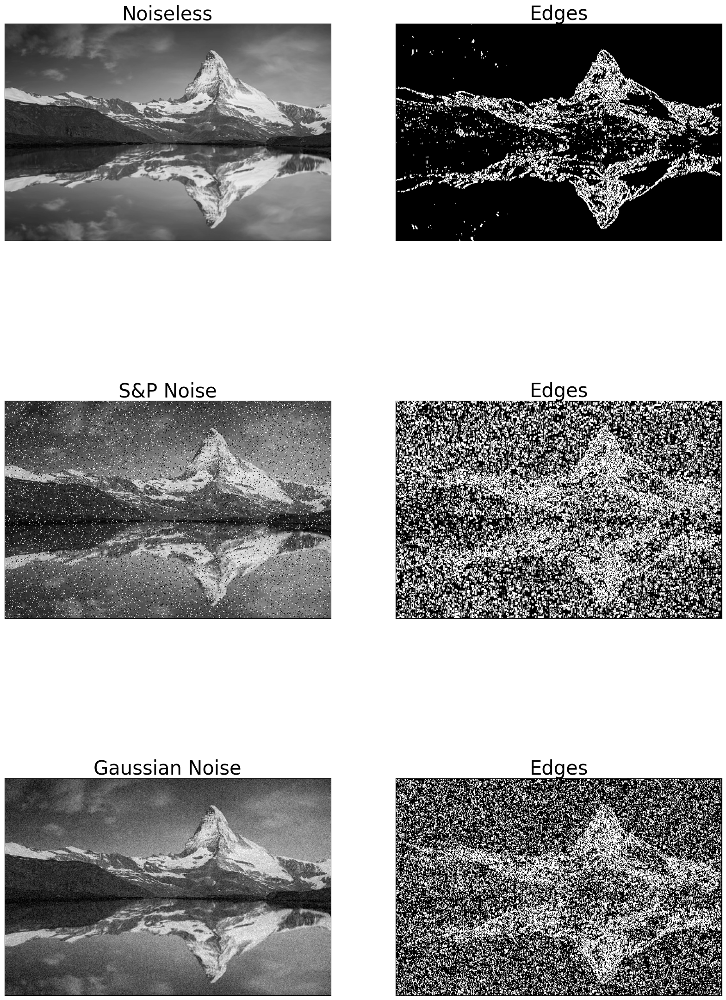

In [78]:
# Load image
imgs = [cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE), 
        cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE),
        cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]

imgs_name = ["Noiseless", "S&P Noise", "Gaussian Noise"]
        
filter_size = 3
thresh = 50 
tvalue = 255

highpass_params = {"ftype":"sobel", "direction":"x", "fsize": filter_size}
thresh_params = {"ttype": cv.THRESH_BINARY, 'thresh':thresh, 'value': tvalue}

fig, ax = plt.subplots(len(imgs), 2, figsize=(20, 10*len(imgs)))

for curr_img_idx, curr_img in enumerate(imgs):
    img_edges = find_edges_naive(curr_img, highpass_params, thresh_params)

    display_image(curr_img, axes=ax[curr_img_idx, 0], cmap='gray')
    ax[curr_img_idx, 0].set_title(imgs_name[curr_img_idx], fontsize=30)
    display_image(img_edges, axes=ax[curr_img_idx, 1], cmap='gray')
    ax[curr_img_idx, 1].set_title("Edges", fontsize=30)
    
plt.show()



**YOUR ANSWER**

- For the clean image, the function using a Sobel high-pass filter then a binary thresholding works perfectly, we can clearly see the highlighted edges, however this is not a practical case, since there is almost never a noiseless clean image.

- For the Salt & Pepper noised image, the naive method works well for highlighting the edges, but it also detects most salt & pepper noise particles as edges, making edges all over the image, which is not the case. It is unusable.

- For the gaussian noise, the naive method works well for highlighting the edges, but it also detects most gaussian noise particles as edges, however real edges are more pronounced than in the salt & pepper noised image, making the naive method better in this case, but still this is just clear for the human eye, nothing the machine would be able to extract and distinguish. It is still unusable. 

Now, let's improve this edge detector by adding a low-pass filter before using the function `find_edges_naive()`. 



**QUESTION:** (/1)

In the next cell, code the function `find_edges_better()` with the following operations:
- Use the function `apply_lowpass_filter()` 
- Use the function `find_edges_naive()` on the low-pass filtered image.


In [81]:
def find_edges_better(img, lowpass_params, highpass_params, thresh_params):
    
    """
    Find edges on a given image.
    :param image: Image to enhance contrast
    :param lowpass_params: Parameters of the low-pass filter
    :param highpass_params: Parameters of the high-pass filter
    :param thresh_params: Parameters of the thresholding operation
    :return: img_edges: Edges of the image
    """
    
    # YOUR CODE HERE
    img_filt = apply_lowpass_filter(img, lowpass_params)
    img_edges = find_edges_naive(img_filt, highpass_params, thresh_params)
    # img_filt = apply_highpass_filter(img_filt, highpass_params)
    # img_edges = threshold_image(img_filt, thresh_params)
    
    return img_edges


The next cell tests your implementation with : 
- a Gaussian filter of size (3x3)
- a Sobel filter of size (3x3) in the x-direction 
- a binary threshold.

**QUESTION:** (/3)

Comment the results.

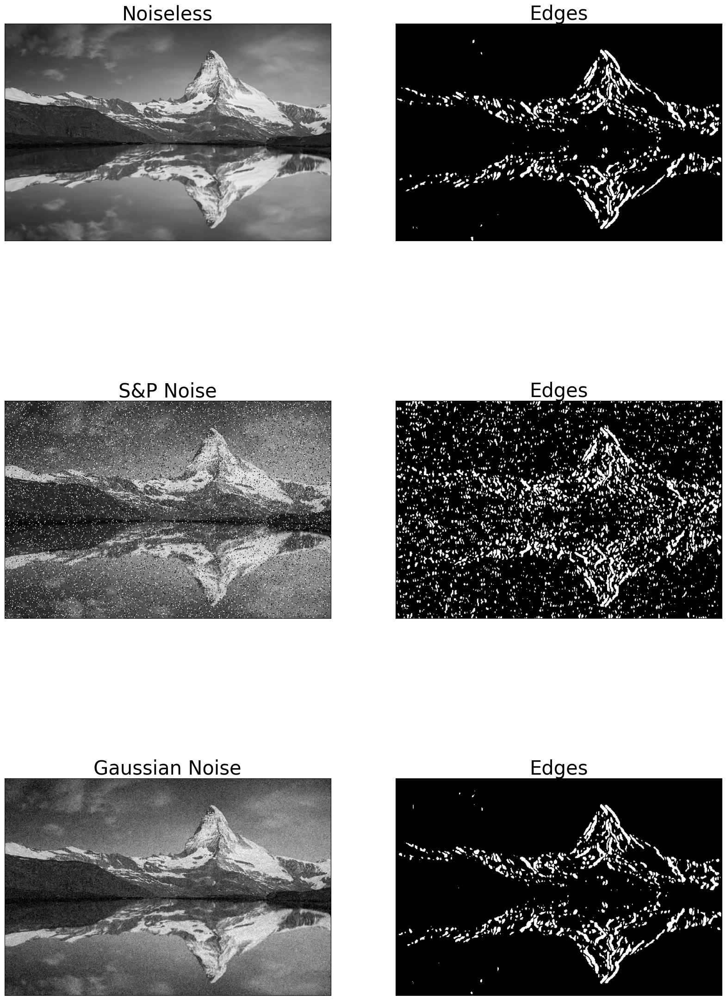

In [82]:
# Load image
imgs = [cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE), 
        cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE),
        cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]

imgs_name = ["Noiseless", "S&P Noise", "Gaussian Noise"]
        
lowpass_filter_size = 7
highpass_filter_size = 3
thresh = 50 
tvalue = 255

lowpass_params = {"ftype":"gaussian", "fsize": lowpass_filter_size}
highpass_params = {"ftype":"sobel", "direction":"x", "fsize": highpass_filter_size}
thresh_params = {"ttype": cv.THRESH_BINARY, 'thresh':thresh, 'value': tvalue}

fig, ax = plt.subplots(len(imgs), 2, figsize=(20, 10*len(imgs)))

for curr_img_idx, curr_img in enumerate(imgs):
    img_edges = find_edges_better(curr_img, lowpass_params, highpass_params, thresh_params)

    display_image(curr_img, axes=ax[curr_img_idx, 0], cmap='gray')
    ax[curr_img_idx, 0].set_title(imgs_name[curr_img_idx], fontsize=30)
    display_image(img_edges, axes=ax[curr_img_idx, 1], cmap='gray')
    ax[curr_img_idx, 1].set_title("Edges", fontsize=30)
    
plt.show()



**YOUR ANSWER**

+ For the noiseless image, we can clearly see the function is detecting edges correctly. It is detecting all edges, along with two-or-three cloud edges. But overall, it is working well, however the fine details in the naive function implementation disappeared.

+ For the S&P noised image, the function is detecting edges correctly, but still it is detecting most S&P noise particles as edges, making the edges pronounced, but still nothing can be distinguished by the machine, it needs more finetuning of the parameters to have the noise reduced and not detected as edges.

+ For Gaussian-noised image, the function workes as intended, we can see the same performance as for the noiseless clean image. It is detecting all edges, along with the same two-or-three cloud edges. But overall, it is much better than the naive function implementation.

Now that you developed some intuition, it is your turn to design the best edge detector for both noisy images. 

**QUESTION:** (/4)

In the next cell, find the combination of low-pass filter, high-pass filter and thresholding operation that gives you the best edges for each noisy image. Justify your choice and comment your results. 


Optimal threshold value computed using Otsu's method: 55.0


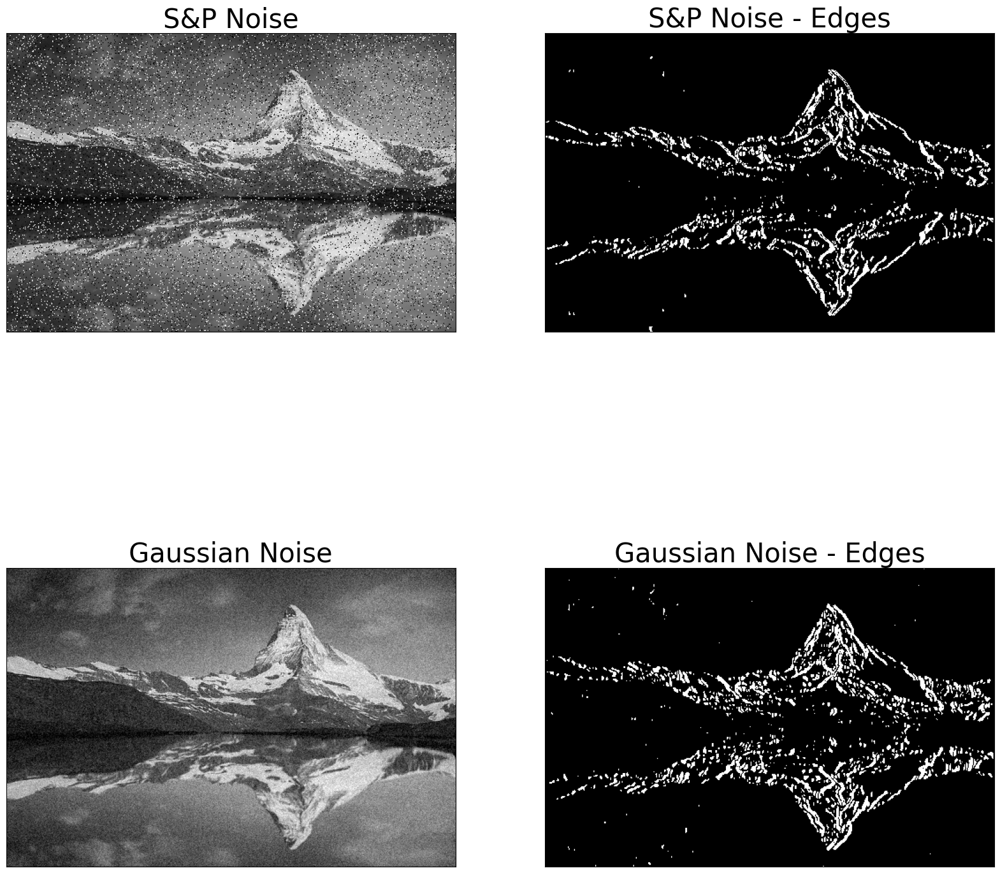

In [ ]:
# Load images
imgs = [cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE),
        cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]

imgs_name = ["S&P Noise", "Gaussian Noise"]

# Best detector parameters 

###################
# YOUR CODE HERE
lowpass_filter_size_g = 7
thresh = 60
tvalue = 255
highpass_filter_size_g = 3

lowpass_filter_size_sp = 5
highpass_filter_size_sp = 1
#Gaussian image
lowpass_params_g = {"ftype":"gaussian", "fsize":lowpass_filter_size_g}
highpass_params_g = {"ftype":"sobel","direction":"x", "fsize":highpass_filter_size_g}
thresh_params_g = {"ttype": cv.THRESH_BINARY, 'thresh':thresh, 'value': tvalue}

#S&P image
lowpass_params_sp = {"ftype":"median", "fsize":lowpass_filter_size_sp}
highpass_params_sp = {"ftype":"sobel", "direction":"x", "fsize":highpass_filter_size_sp}
thresh_params_sp = {"ttype": cv.THRESH_BINARY+cv.THRESH_OTSU, 'thresh':thresh, 'value': tvalue}
###################

# Edge detection
lowpass_params = [lowpass_params_sp, lowpass_params_g]
highpass_params = [highpass_params_sp, highpass_params_g]
thresh_params = [thresh_params_sp, thresh_params_g]

fig, ax = plt.subplots(len(imgs), 2, figsize=(20, 10*len(imgs)))

for curr_img_idx, curr_img in enumerate(imgs):
    img_edges = find_edges_better(curr_img, lowpass_params[curr_img_idx], highpass_params[curr_img_idx], thresh_params[curr_img_idx])

    display_image(curr_img, axes=ax[curr_img_idx, 0], cmap='gray')
    ax[curr_img_idx, 0].set_title(imgs_name[curr_img_idx], fontsize=30)
    display_image(img_edges, axes=ax[curr_img_idx, 1], cmap='gray')
    ax[curr_img_idx, 1].set_title("{} - Edges".format(imgs_name[curr_img_idx]), fontsize=30)
    
plt.show()

**YOUR ANSWER**

+ Gaussian-noised image parameters' choice: It just makes sense to choose a `Gaussian` filter as a low-pass filter, with a relatively big kernel (7x7), then a high-pass `Sobel` filter over the `x` direction, as well as a kernel of size (3x3), since it is small enough to not cause noise particles all over the image, but at the same time not minimal to be able to detect edges and not consider everything as noise. For the thresholding, `Otsu's method` did not work the best, `To Zero` & `Trunc` thresholds did not work, since they involve a range of values and not binary values, which we do not really need for edge detection.

+ S&P-noised image parameters' choice: I chose a `Median` filter as a low-pass filter, since it worked the best before with the S&P-noised image with a 5x5 kernel, then a high-pass `Sobel` filter over the `x` direction, as well as a kernel of size 1x1, as it did not consider edges as noise particles, so it worked well. For thresholding, I used a mmix of `Binary` thresholding with the threshold defined by `Otsu's method`, it worked well with edge detection. The smaller kernel for the low-pass filter resulted in finer-details detection, compared to the Gaussian-noised image, and `Otsu's method` resulted in good binary threshold definition, as opposed to trials and errors for the Gaussian-noised image.

As you can imagine, the OpenCV library has some edge detection algorithm directly available. One of them is the [Canny edge detector](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga2a671611e104c093843d7b7fc46d24af). More info [here] (https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html). 

**QUESTION:** (/2)

In the next cell, implement the function `find_edges_canny()` which takes as input an image and the detector parameters (thresholds for filtering (See [doc](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga2a671611e104c093843d7b7fc46d24af)), and the filter size) and returns the filtered image. Use the corresponding OpenCV function. 


In [119]:
def find_edges_canny(img, canny_params):
    """
    Apply a canny filter on a given image.
    :param img: Image to enhance contrast
    :param th: Range of the filter threshold 
    :param filter_size: Size of the filter
    :return: img_filt: filtered image
    """

    # YOUR CODE HERE
    thresh1, thresh2 = canny_params.get('thresholds', (100, 200))
    filter_size = canny_params.get('fsize', 3)
    img_filt = cv.Canny(img, thresh1, thresh2, apertureSize=filter_size)

    return img_filt


The next cell tests your implementation with a filter of size (3x3) and four threshold ranges. 

**QUESTION:** (/2)

What is the effect of each threshold (low/high minimal threshold, low/high maximal threshold) on the filtered image?


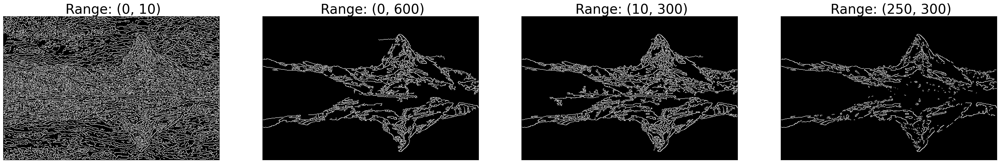

In [120]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)

# Canny filtering
filter_size = 3

thresholds = [(0, 10), (0, 600), (10, 300), (250, 300)]

fig, ax = plt.subplots(1, len(thresholds), figsize=(10*len(thresholds), 10))

for curr_thresh_idx, curr_thresh in enumerate(thresholds):
    
    canny_params = {"fsize":filter_size, "thresholds":curr_thresh}
    img_canny = find_edges_canny(img, canny_params)
    display_image(img_canny, axes=ax[curr_thresh_idx], cmap='gray')
    ax[curr_thresh_idx].set_title(" Range: {}".format(curr_thresh), fontsize=30)

plt.show()



**YOUR ANSWER**

+ ***Range (0, 10):***

    Detects all edges, including all noise particles, resulting in a very noisy edge map.

+ ***Range (0, 600):***

    Detects most edges. Most edges are a bit thick, it detects a lot of fine details, which can seem a bit unnecessary. However the edge map is fine.

+ ***Range (10, 300):***

    Detects most edges. Most edges are a bit thick, it detects even more fine details. However the edge map is fine.

+ ***Range (250, 300):***

    Detects all edges. All edges are fine, and it ignores most fine details. The edge map is even better. There are a few noise particles detected, but overall it is much better than all other ranges.

We can now give as summary:

+ ***Low minimal threshold:*** Detects almost all edges, including noise particles, resulting in a very noisy edge map.
+ ***High minimal threshold:*** Detects an unnecessary number of edges, since it includes unimportant edges.
+ ***Moderate threshold:*** Detects a non-bad balance of edges, but an even more unnecessary number of edges. It reduces noise, and still detects a lot of fine-detailed edges.
+ ***High maximal threshold:*** Detects only the strongest or rather the most important edges, missing some of the fine details, but still edges are thin and well-pronounced, still it detects them well.

In the previous cell, you found the edges of the noiseless image. 


**QUESTION:** (/4)

In the next cell, find the thresholds that give the best edges for the images `matterhorn_noise1.jpg` and `matterhorn_noise2.jpg`. Justify your choice, and compare your results with the homemade edge detector you implemented previously. 


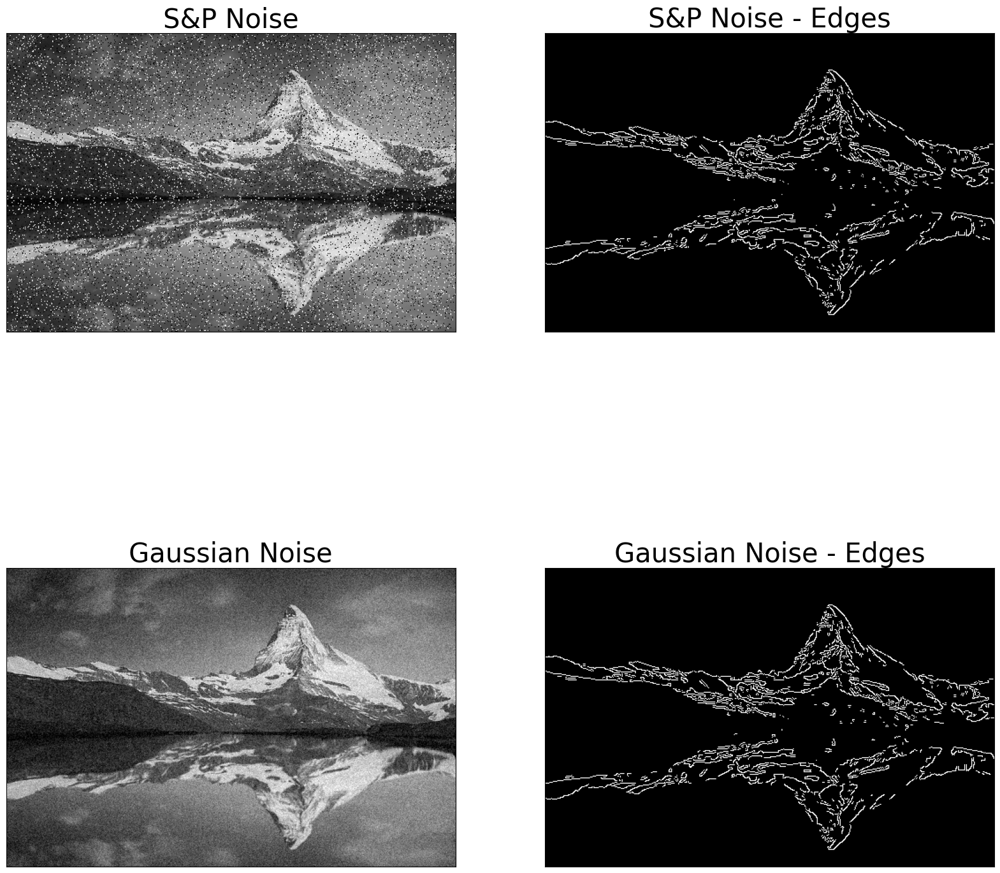

In [158]:
# Load images
imgs = [cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE),
        cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]

imgs_name = ["S&P Noise", "Gaussian Noise"]

# Best detector parameters 


###################
# YOUR CODE HERE
canny_params_sp = {"fsize":3, "thresholds":(270, 320)}
canny_params_g = {"fsize":3, "thresholds":(250, 320)}
###################

# Edge detection
canny_params = [canny_params_sp, canny_params_g]

fig, ax = plt.subplots(len(imgs), 2, figsize=(20, 10*len(imgs)))

for curr_img_idx, curr_img in enumerate(imgs):
    img_edges_canny = find_edges_canny(img, canny_params[curr_img_idx])

    display_image(curr_img, axes=ax[curr_img_idx, 0], cmap='gray')
    ax[curr_img_idx, 0].set_title(imgs_name[curr_img_idx], fontsize=30)
    display_image(img_edges_canny, axes=ax[curr_img_idx, 1], cmap='gray')
    ax[curr_img_idx, 1].set_title("{} - Edges".format(imgs_name[curr_img_idx]), fontsize=30)
    
plt.show()


**YOUR ANSWER**

S&P Noise:
   - Canny parameters: `{"fsize": 3, "thresholds": (270, 320)}`
   - These thresholds are chosen to balance between detecting edges and reducing noise.

Gaussian Noise:
   - Canny parameters: `{"fsize": 3, "thresholds": (250, 320)}`
   - These thresholds are chosen to detect edges while minimizing the effect of Gaussian noise.

The Canny edge detector is more sophisticated and typically provides better results compared to the selfmade edge detector. It includes non-maximum suppression and hysteresis thresholding, which helps in detecting strong edges while suppressing weak edges and noise.


## 1.3 Introduction to Histogram of Gradient (*HoG*)

(30 points)

### 1.3.1 Introduction

Histogram of Oriented Gradients (*HOGs*) are descriptors mainly used in computer vision and machine learning for object detection. HOG features were first introduced by Dalal and Triggs in their CVPR 2005 paper: "Histogram of Oriented Gradients for Human Detection" (<http://ieeexplore.ieee.org/document/1467360/>); which transforms image pixels into a vector representation that is sensitive to broadly informative image features regardless of confounding factors like illumination. Later on, we will use these descriptors for detection and tracking. 


In their work, Dalal and Triggs proposed HOG and a 5-stages descriptor to classify humans in static images.
The 5 stages included:

    1. Pre-processing and scaling.
    2. Computing gradients in both the x and y directions.
    3. Obtaining weighted votes in spatial cells (local histograms).
    4. Contrast normalizing overlapping spatial cells (Blocks).
    5. Collecting all Histograms of Oriented gradients to form the final feature vector.


In most real-world applications, HOG is used in conjunction with a [__Linear SVM__](https://en.wikipedia.org/wiki/Support_vector_machine) to perform object detection. HOG rapidly became one of the most used descriptors in image classification. The reason HOG is employed so heavily is because the local object appearance and shape can be characterized using the distribution of local intensity gradients. 

We’ll be discussing the steps necessary to combine both HOG and a Linear SVM into an object classifier later in this course. But for now, just understand that HOG is mainly used as a descriptor for object detection and that later these descriptors can be fed into a machine learning classifier.


### 1.3.2 Objectives of this module

HOG based classifiers are already implemented in several methods inside OpenCV. In this module, we will follow the basic steps to construct a feature vector based on HOG from scratch. Once the basic concepts are clear, at the end of this notebook, we will include the OpenCV build-in function used in real-world applications. The parameters of this function should be then clear for you to tune and play with for later applications.

*What are HOG descriptors used to describe?*

HOG descriptors are mainly used to describe the structural shape and appearance of an object in an image, making them excellent descriptors for object classification. In addition, since HOG captures local intensity gradients and edge directions, it also makes them good as texture descriptors.


### 1.3.3 Preprocessing

Typically, a feature descriptor converts an image of size $ width \times height \times 3 $(channels) to a feature vector array of length $n$. In the case of our implementation of the HOG feature descriptor, the input will be a grayscale image of size 64 x 128 and the output feature vector of a length that will depend on various choices that we will make along the notebook. 

Before any computation, we must ensure the input image has the right shape. 

**QUESTION:** (/2)

In the next cell, convert the image `lena.png` into the desired format, i.e. a grayscale image of size (64x128).

Input image has dimensions: (512, 512, 3)
Final image has dimensions: (128, 64)


Text(0.5, 1.0, 'Image for HoG')

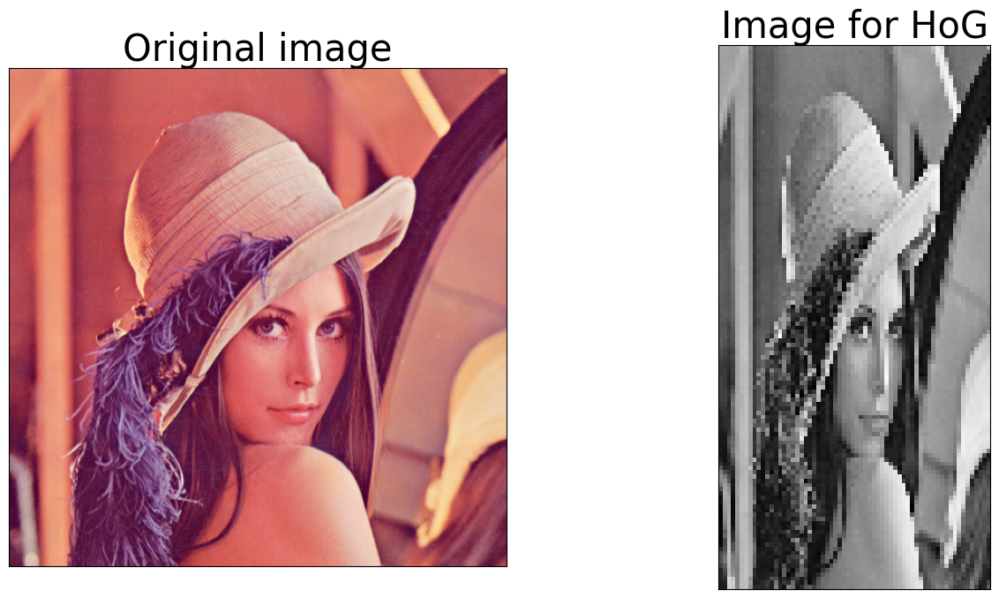

In [162]:
# loads base image
img = cv.imread(os.path.join('data', 'lena.png'))
print('Input image has dimensions: {}'.format(img.shape))

# converts to grayscale and resize

###################
# YOUR CODE HERE 
img_gray= cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_gray = cv.resize(img_gray, (64, 128))
###################

print('Final image has dimensions: {}'.format(img_gray.shape))

fig, ax = plt.subplots(1, 2, figsize=(16, 8))
display_image(img, axes=ax[0])
ax[0].set_title("Original image", fontsize=30)
display_image(img_gray, axes=ax[1], cmap='gray')
ax[1].set_title("Image for HoG", fontsize=30)



### 1.3.4 Gradient computation

https://en.wikipedia.org/wiki/Image_gradient

Gradient vectors (or “image gradients”) are one of the most fundamental concepts in computer vision; many vision algorithms involve computing gradient vectors for each pixel in an image. A gradient vector it’s simply a measure of the change in pixel values along the x-direction and the y-direction around each pixel. The magnitude is defined as:

$$
G(x,y) = \sqrt{(\Delta x^2 + \Delta y^2)}
$$

and the phase: 

$$
\theta(x,y) = atan(\frac{\Delta x}{\Delta y})
$$

Where: $\Delta x = f(x+1,y) - f(x-1,y)$ and $\Delta y = f(x,y+1) - f(x,y-1)$, are simply the directional change from one pixel to the other.

The simplest implementation of the aforementioned operators computes each value by using a mask operator: $-1|0|1$ over the pixel position in each direction. However the Sobel operator you implemented in Section 1.2.2 is usually employed as it is more robust to intensity changes.

**QUESTION** (/2)

In the next cell, use the function `apply_sobel_filter` on the image `img_gray` to compute the gradient of the image in the `x` and `y` directions.



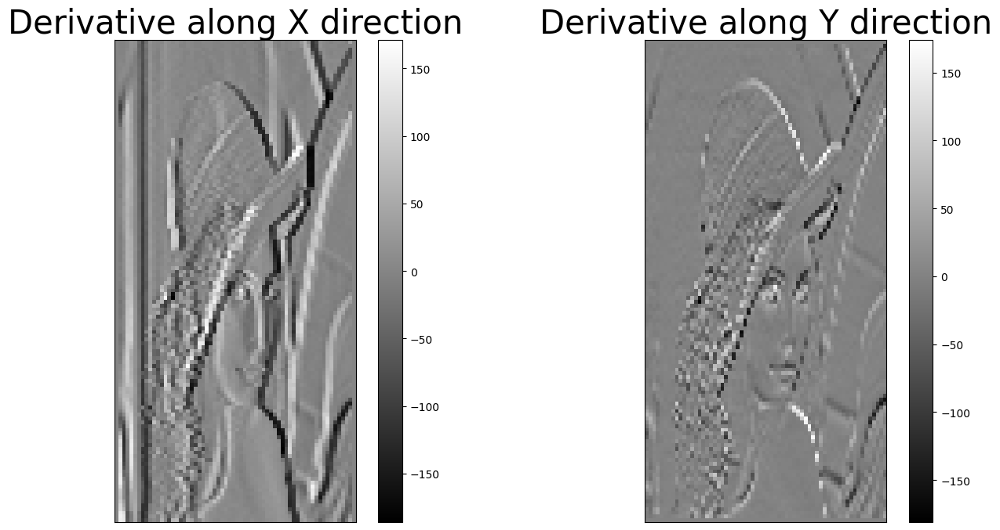

In [ ]:
filter_size = 1

# Sobel filtering


###################
# YOUR CODE HERE
gx = apply_sobel_filter(img_gray, "x", filter_size)
gy = apply_sobel_filter(img_gray, "y", filter_size)
###################

fig, ax = plt.subplots(1, 2, figsize=(16, 8))
obj = display_image(gx, axes=ax[0])
ax[0].set_title('Derivative along X direction', fontsize=30)
fig.colorbar(obj, orientation ='vertical', ax=ax[0])
obj = display_image(gy, axes=ax[1])
ax[1].set_title('Derivative along Y direction', fontsize=30)
fig.colorbar(obj, orientation ='vertical', ax=ax[1])
plt.show()

**QUESTION**: (/2)
- Do the images above make sense?  Explain what each image displayed. 
- What do the brightest or darkest pixels mean for each direction?


**YOUR ANSWER**
+ Yes they do make sense.

    + The Derivative along the x direction (axis) shows the edges along the x axis (vertical axis) more pronounced in the image.

    + The Derivative along the y direction (axis) shows the edges along the y axis (horizontal axis) more pronounced in the image.

+ The darker pixels mean the derivative along the given direction is stronger than the brighter pixels.

As mentionned in the introduction, the images above shows the gradient in a given direction. We can use them to compute the magnitude and phase as in the above formulas.

**QUESTION**: (/1)

In the next cell, compute the magnitude and the phase (in degrees) of each pixel from the gradient maps `gx` and `gy` computed above. 

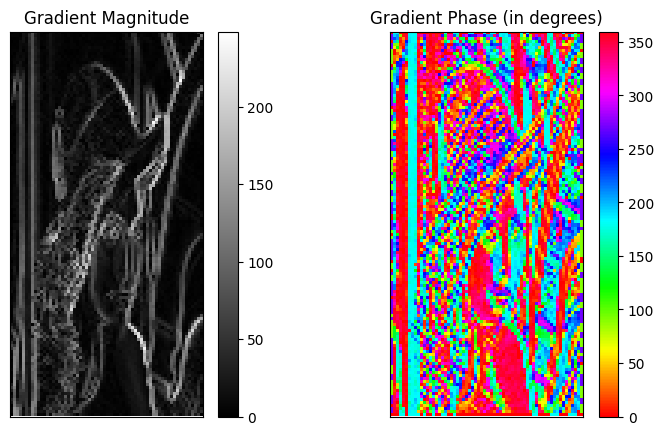

In [171]:


###################
# YOUR CODE HERE
magnitude = np.sqrt(gx**2 + gy**2)
phase = np.arctan2(gy, gx) * (180.0 / np.pi)  # Convert radians to degrees
phase[phase < 0] += 360  # Normalize phase to [0, 360]
###################

# Plots of the magnitude and the phase:
fig, ax = plt.subplots(1, 2, figsize=(9, 5))

#The magnitude is shown in gray scale.
obj = display_image(magnitude, axes=ax[0])
ax[0].set_title('Gradient Magnitude')
fig.colorbar(obj, orientation ='vertical', ax=ax[0])

# The phase is shown using a color map. 
obj = display_image(phase, axes=ax[1], cmap='hsv')
ax[1].set_title('Gradient Phase (in degrees)')
fig.colorbar(obj, orientation ='vertical', ax=ax[1])
plt.show()

From the image above, we see that the phase is computed from 0 to 360 degrees. While this is conceptually correct, two pixels with very similar angular values towards the X-axis (let's say 0.1 radians and 6.2 radians) will be considered very different by a naive classifier. We correct this behavior by wrapping the phase from 0 to $\pi$ (0 to 180 degrees). At the end of the notebook, you will correct the phase range.


**QUESTION:** (/1)

From the phase image, we see many red pixels (values very close to zero). Interpret this observation.

**Hint:** consider the values of gx and gy in those regions.

**YOUR ANSWER**

The red pixels (values close to zero), indicate regions where the gradient vector is mainly aligned with the x axis, showing that for these pixels (regions), the change in pixel values is mainly occurring in the x direction (vertically), and there is little to no change in the y direction (horizontally).

+ To summarize:

    - The gradient in the x direction is strong.
    - The gradient in the y direction is close to zero.

### 1.3.5 Computation of the Histograms of the Phase for Local Cells

In the next step, you will compute the histograms of Oriented Gradients, which are histograms of the phase distribution in a region of the image. We split the image into cells, rectangular regions of interest sliding across the image domain. The size and shape of the cell will affect the performance of HOG as a feature vector. For each cell, you will compute a histogram. In this work, you will use $8 px\times 8px$ cells. 

In the next cell, we show you the cell subdivisions of the (color) image for cells of size $8\times 8$ and the histogram of the first cell of the image (starting at the pixel (0, 0)) with 36 bins. The number of bins considered will affect the performance and quality of the descriptor. In the original paper, Dalal and Triggs found that nine bins (from 0 to 180 degrees) performed well for human detection. 

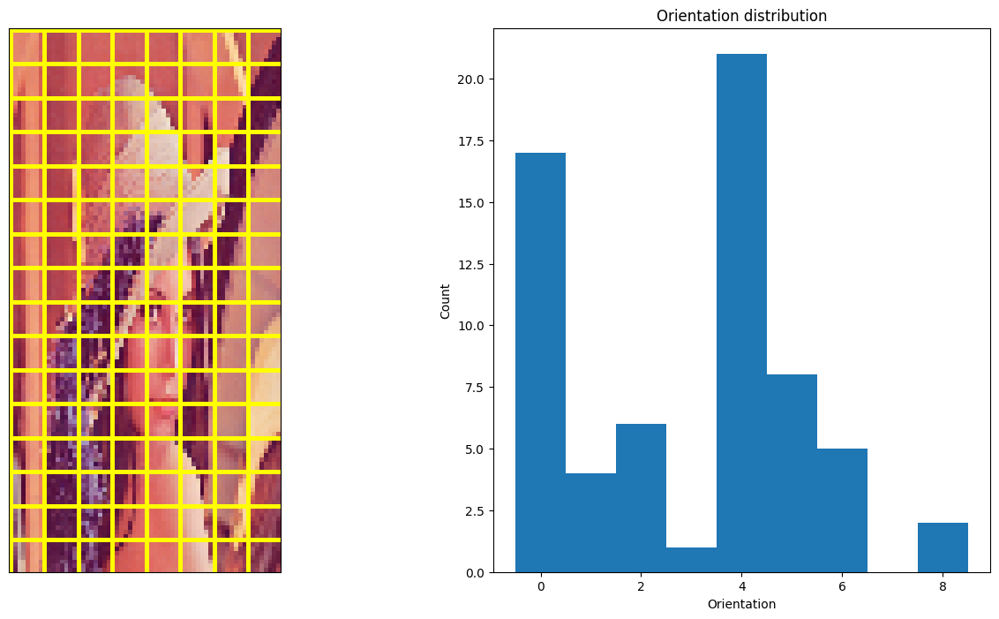

In [172]:
# This parameter is usually constant and it's never changed true the procedure.
CELL_SIZE = 8;

# Histogram of the Phase for the very first cell
num_of_bins = 9

# Compute histogram
hist = cv.calcHist([phase[:CELL_SIZE, :CELL_SIZE].astype(np.float32)], channels=[0], mask=None, histSize=[num_of_bins], ranges=[0,360])

# Example of a cell drawn in yellow
img_canvas = cv2.resize(img, (64, 128)) # temporal image.

for stride_x in range(1,img.shape[0]-1):
    for stride_y in range(1,img.shape[1]-1):
        cv2.rectangle(img_canvas, (0 + (stride_x-1)*CELL_SIZE, 0 + (stride_y-1)*CELL_SIZE), (0 + stride_x*CELL_SIZE, 0 + stride_y*CELL_SIZE), (0, 255, 255))

# Plot
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

display_image(img_canvas, axes=ax[0])

ax[1].bar(np.arange(hist.shape[0]), hist.reshape(-1), width=1)
ax[1].set_xlabel('Orientation')
ax[1].set_ylabel('Count')
ax[1].set_title('Orientation distribution')

plt.show()

The previous cell shows you how to compute the histogram of one cell, but we need the histogram of each cell.

**QUESTION:** (/5)

In the next cell, implement the function `computeCellHistograms()` that takes as input the phase of the image, the number of bins, and the cell size, and returns a [list](https://docs.python.org/3/tutorial/datastructures.html) containing the histograms. 

In [173]:
def computeCellHistograms(phase, cell_size, num_of_bins):
    """
    Compute histogram for each cells and concatenate them.
    
    :param phase: 1 channel image with the gradient direction.
    :params cell_size: cell size (8px) 
    :params num_of_bins: number of bins in the histogram
    :return concatenated_histograms: list of histograms
    """
    
    # Resulting histogram list
    concatenated_histograms =[];
    
    # Compute the histogram for each cell
    
    # YOUR CODE HERE
    for i in range(0, phase.shape[0], cell_size):
        for j in range(0, phase.shape[1], cell_size):
            cell_phase = phase[i:i+cell_size, j:j+cell_size].astype(np.float32)
            hist = cv.calcHist([cell_phase], channels=[0], mask=None, histSize=[num_of_bins], ranges=[0, 360])
            concatenated_histograms.append(hist)
     
    return concatenated_histograms


The next cell tests your implementation.

**QUESTION**: (/1)

What should be the number of histograms? Is it correct?


In [174]:
# Compute histogram
histograms = computeCellHistograms(phase, CELL_SIZE, num_of_bins)

print("Number of histograms: {}".format(len(histograms)))

Number of histograms: 128


**YOUR ANSWER**

The number of histograms should be ***image_height*** * ***image_width*** / ***cell_size*** ^2, which is 128*64/64, being 128.

The function `computeCellHistograms()` computes the histogram of each cell. However, it assumes that each direction has the same importance and contributes equally to the histogram. In the original paper, they proposed to weight the histogram, for instance, using the gradient magnitude. The histogram bins of each cell are weighted by the gradient magnitude. The effect is depicted below:

<img src="https://gurus.pyimagesearch.com/wp-content/uploads/2015/03/hog_histogram_animation.gif">
<em> Image taken from: https://gurus.pyimagesearch.com </em>

The effect of normalizing the weights will directly affect the contribution of each direction.

**QUESTION:** (/5)

In the next cell, implement the function `computeCellWeightedHistogram()` to return weighted histograms. The new version takes as input the phase of the image, the cell size, the number of bins, and the gradient magnitude and returns a [list](https://docs.python.org/3/tutorial/datastructures.html) containing the histograms. 

**HINT:** Avoid pre-defined functions to compute the histogram and code your own function.



In [197]:
def computeCellWeightedHistogram(phase, magnitude, cell_size, num_of_bins):
    
    """
    Compute weighted histogram for each cells and concatenate them.
    
    :param phase: 1 channel image with the gradient direction.
    :param magnitude: 1 channel image with the gradient magnitude.
    :params cell_size: cell size (8px) 
    :params num_of_bins: number of bins in the histogram 
    :return weigthed_and_concatenated_histograms: list of weighted histograms
    """

    weigthed_and_concatenated_histograms = []
    
    
    # CODE HERE
    bin_width = 360 / num_of_bins
    for i in range(0, phase.shape[0], cell_size):
        for j in range(0, phase.shape[1], cell_size):
            cell_phase = phase[i:i+cell_size, j:j+cell_size]
            cell_magnitude = magnitude[i:i+cell_size, j:j+cell_size]
            hist = np.zeros((num_of_bins, 1), dtype=np.float32)
            for x in range(cell_phase.shape[0]):
                for y in range(cell_phase.shape[1]):
                    angle = cell_phase[x, y]
                    mag = cell_magnitude[x, y]
                    bin_idx = int(angle // bin_width) % num_of_bins
                    hist[bin_idx] += mag
            weigthed_and_concatenated_histograms.append(hist)
            
    return weigthed_and_concatenated_histograms

The next cell shows you the histogram and the weighted histogram of the first cell. 

**QUESTION:** (/3)

Compare and comment the histograms.

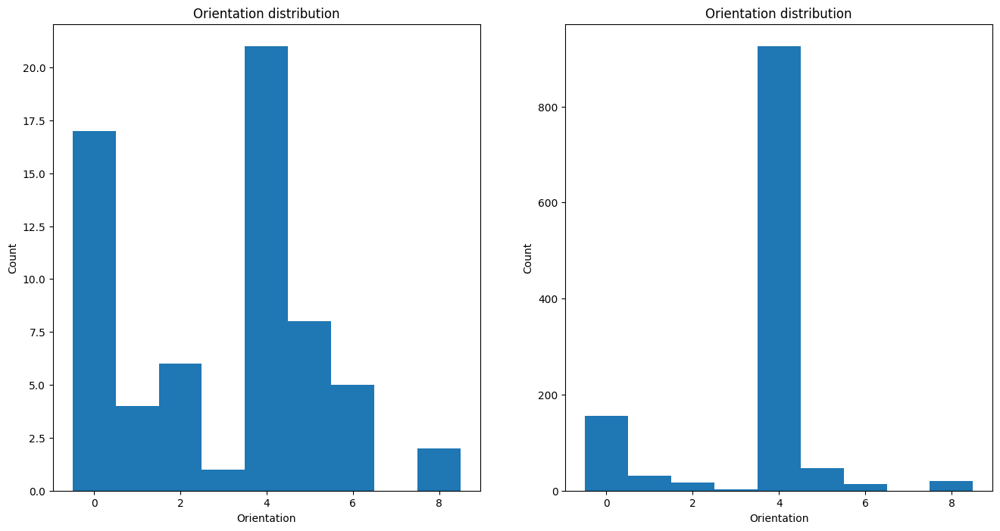

In [198]:
# Compute weighted histogram
weightedHistograms = computeCellWeightedHistogram(phase, magnitude, CELL_SIZE, num_of_bins)


# Plot
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].bar(np.arange(histograms[0].shape[0]), histograms[0].reshape(-1), width=1)
ax[0].set_xlabel('Orientation')
ax[0].set_ylabel('Count')
ax[0].set_title('Orientation distribution')


ax[1].bar(np.arange(weightedHistograms[0].shape[0]), weightedHistograms[0].reshape(-1), width=1)
ax[1].set_xlabel('Orientation')
ax[1].set_ylabel('Count')
ax[1].set_title('Orientation distribution')

plt.show()

**YOUR ANSWER**

In the unweighted histogram, each orientation bin is incremented by 1 for every pixel whose gradient falls within that bin. In the weighted histogram, each bin is incremented by the gradient magnitude of each pixel whose gradient falls within that bin. As a result, stronger edges contribute more to the bins in the weighted histograms, changing the distribution so that the orientation with high-intensity gradients stand out more clearly.

### 1.3.6 Block normalization

In the previous steps, we created the oriented histogram based on the gradient magnitude. However, gradients are sensitive to overall lighting. If you make the image darker by dividing all pixel values by 2, for example, the gradient magnitude will change by half, and, therefore, the histogram values will change by half. Ideally, we want our descriptor to be independent of lighting variations. In other words, we would like to “normalize” the histograms to stabilitze the results. 

Rather than normalizing each histogram individually, we group the cells into __blocks__ and normalize the histogram of the block instead of the indivual cell. These procedure makes the feature detector less sensitive to intensity changes.


<img src = "https://gurus.pyimagesearch.com/wp-content/uploads/2015/03/hog_contrast_normalization.gif">
<em> Image taken from: https://gurus.pyimagesearch.com </em>

Image above shows each block as a group of 4 cells (2 by 2 cells). The blocks overlap each other and, therefore, each cell is represented in the histograms multiple times. This redundancy actually improves accuracy. Finally, we take the resulting block histograms, concatenate them, and treat them as our final feature vector.


**QUESTION:** (/6)

In the next cell, implement the function `BlockNormalizationAndFeatureConcatenation()` that takes as input the histograms, and the image size and returns the feature vector of histogram normalized with the L2 norm. 

In [202]:
def BlockNormalizationAndFeatureConcatenation(histograms, img_size, cell_size, NB_BLOCK_CELLS_X = 2, NB_BLOCK_CELLS_Y = 2):
    
    """
    Compute histogram  block normalization
    
    :param histograms: list of weighted histograms
    :params img_size:  size of the image
    :return 
    """
    
    feature_vector    = []
    
    #CODE HERE

    num_cells_y = img_size[0] // cell_size
    num_cells_x = img_size[1] // cell_size

    for x in range(num_cells_x - NB_BLOCK_CELLS_X + 1):
        for y in range(num_cells_y - NB_BLOCK_CELLS_Y + 1):
            block_hist = []
            for bx in range(NB_BLOCK_CELLS_X):
                for by in range(NB_BLOCK_CELLS_Y):
                    cell_index = (bx + x) * num_cells_y + (by + y)
                    block_hist.append(histograms[cell_index])

            block_hist = np.concatenate(block_hist).flatten()
            norm = np.linalg.norm(block_hist) + 1e-6  # Avoid division by zero
            normalized_block_hist = block_hist / norm
            feature_vector.append(normalized_block_hist)
    return feature_vector

The next cell shows you the histogram of the first cell, the weighted histogram of the first cell and the histogram of the first block.

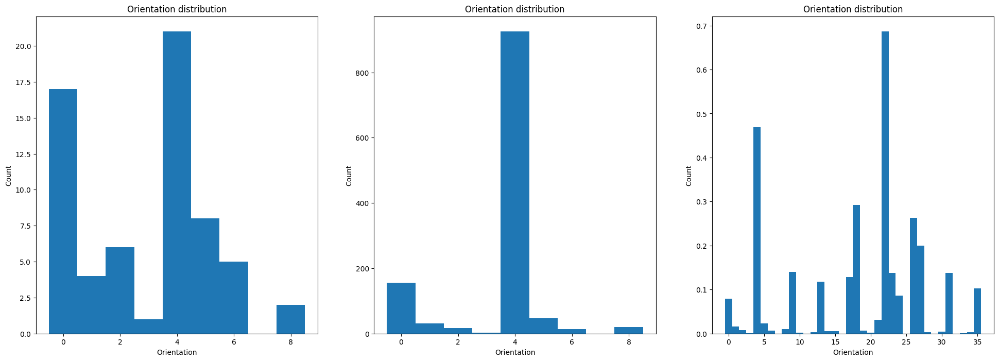

In [203]:
# Compute feature vector
feature_vector = BlockNormalizationAndFeatureConcatenation(weightedHistograms, img_gray.shape, CELL_SIZE)

# Plot
fig, ax = plt.subplots(1, 3, figsize=(24, 8))

ax[0].bar(np.arange(histograms[0].shape[0]), histograms[0].reshape(-1), width=1)
ax[0].set_xlabel('Orientation')
ax[0].set_ylabel('Count')
ax[0].set_title('Orientation distribution')

ax[1].bar(np.arange(weightedHistograms[0].shape[0]), weightedHistograms[0].reshape(-1), width=1)
ax[1].set_xlabel('Orientation')
ax[1].set_ylabel('Count')
ax[1].set_title('Orientation distribution')

ax[2].bar(np.arange(feature_vector[0].shape[0]), feature_vector[0].reshape(-1), width=1)
ax[2].set_xlabel('Orientation')
ax[2].set_ylabel('Count')
ax[2].set_title('Orientation distribution')


plt.show()

### 1.3.7 Feature Vector Visualization

The final descriptor is then a 1-dimentional array with the concatenation of the blocks normalized histograms. However, this shouldn't prevent us from having an intuitive visualization of the computed features. 

**QUESTION:**(/5)

As last exercise, you need to display the feature vector over the image space (or any clever way).

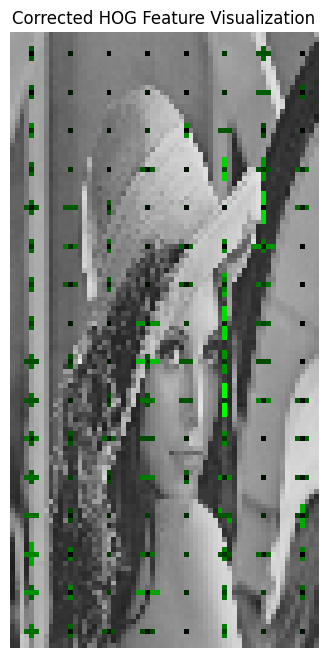

In [212]:
# YOUR CODE HERE

img = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)

height, width = img_gray.shape
cell_size = 8
num_cells_y = height // cell_size
num_cells_x = width // cell_size
num_of_bins = 9 # Make sure this is correctly defined
bin_width = 180 / num_of_bins # Standard HOG uses 180 degrees (unsigned)

weightedHistograms = np.array(weightedHistograms).reshape(num_cells_y, num_cells_x, num_of_bins)
# --- FIX 1: Normalize magnitudes for consistent visualization ---
# Find the maximum magnitude in all histograms to scale the lines properly
max_mag = np.max(weightedHistograms)
if max_mag == 0: max_mag = 1e-6 # Avoid division by zero

for y in range(num_cells_y):
    for x in range(num_cells_x):
        # Use 2D indexing for clarity and robustness
        cell_hist = weightedHistograms[y, x]

        center_x = x * cell_size + cell_size // 2
        center_y = y * cell_size + cell_size // 2

        # --- FIX 2: Loop through ALL bins, not just the dominant one ---
        for i, mag in enumerate(cell_hist):
            # Skip drawing for very weak magnitudes
            if mag < 1e-4:
                continue

            angle = i * bin_width # The angle is simply the bin's orientation
            angle_rad = np.deg2rad(angle)

            # --- FIX 3: Make line length proportional to magnitude ---
            # The line's length now directly represents the gradient's strength
            scale = (mag / max_mag) * cell_size * 0.45

            dx = int(scale * np.cos(angle_rad))
            dy = int(scale * np.sin(angle_rad))

            pt1 = (center_x - dx, center_y - dy)
            pt2 = (center_x + dx, center_y + dy)
            
            # Optional: Make color intensity proportional to magnitude too
            color_intensity = int(255 * (mag / max_mag))

            cv2.line(img, pt1, pt2, (0, color_intensity, 0), 1)

# Display
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Corrected HOG Feature Visualization')
plt.axis('off')
plt.show()

### Comment

The `HOG` descriptor shows a line in each cell, showing exactly what it detects in the given cell, either nothing, or a horizontal edge, a vertical edge or both, for which it shows a dot, horizontal line, vertical line or a cross respectively. The strength of the edge is also given by the brightness of the line in the cell.

The `HOG`, being a histogram of oriented gradients, is exactly as it sounds, helping us create a map of the local gradient structures for each region/cell of the image. This abstract representation is what makes `HOG` powerful for tasks like object detection.

### 1.3.8 HOG in action

As you may suspect already, OpenCV comes with a nice implementation of the HOG descriptor. Once you finish this notebook, you should be able to understand the basic parameters from the `cv.HOGDescriptor()` class.

In the next cell, we use a simple Support Vector Machine algorithm (SVM) to detect People in multi-scale images.

Image has dimensions: (640, 480, 3)


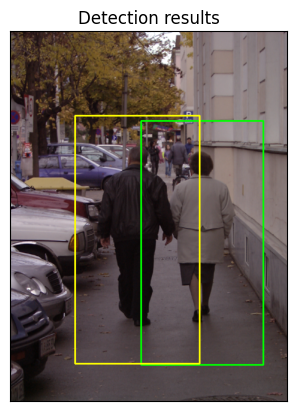

In [214]:
# initialize the HOG descriptor/person detector
hog = cv.HOGDescriptor()
hog.setSVMDetector(cv.HOGDescriptor_getDefaultPeopleDetector())

# load base image (check that we are not scaling, normalizing or changing the channels)
img = cv.imread(os.path.join('data', 'person_104.bmp'))
print('Image has dimensions: {}'.format(img.shape))

# The HOG detector returns an array with the Regions of maximum likehood to contain a human-shaped-form
rects, weights = hog.detectMultiScale(img, winStride=(4, 4), padding=(8, 8), scale=1.05)

# draw the original bounding boxes
persons = 0;
for (x, y, w, h) in rects:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, persons * 256), 2)
    persons += 1;
    
display_image(img);
plt.title('Detection results')
plt.xticks([])
plt.yticks([]);

Image has dimensions: (480, 640, 3)


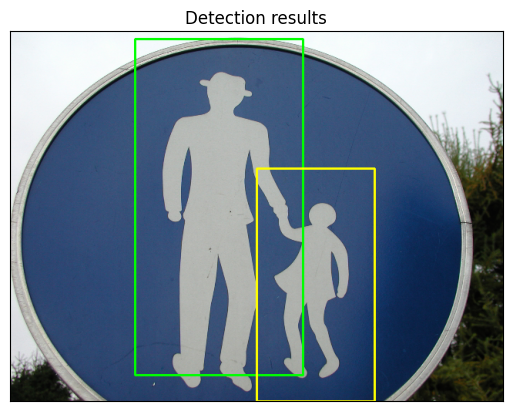

In [215]:
# load base image
img = cv.imread(os.path.join('data', 'person_454.bmp'))
print('Image has dimensions: {}'.format(img.shape))

# The HOG detector returns an array with the Regions of maximum likehood to contain a human-shaped-form
rects, weights = hog.detectMultiScale(img , winStride=(4, 4), padding=(8, 8), scale=1.05)

# draw the original bounding boxes
persons = 0;
for (x, y, w, h) in rects:
    cv2.rectangle(img , (x, y), (x + w, y + h), (0, 255, persons * 256), 2)
    persons += 1;
    
display_image(img);
plt.title('Detection results')
plt.xticks([])
plt.yticks([]);

### 1.3.9 References

https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients

https://www.learnopencv.com/histogram-of-oriented-gradients/

http://juliaimages.github.io/ImageFeatures.jl/latest/tutorials/object_detection.html

https://www.learnopencv.com/tag/hog/